# Text-based Emotion Classifier

---

### Source of Dataset

> We will be using the [Emotions dataset for NLP](https://www.kaggle.com/praveengovi/emotions-dataset-for-nlp) by Praveen.

### Format of Dataset

> | text         | emotion |
> |--------------|---------|
> |i didnt feel humiliated | sadness |
> |i can go from feeling so hopeless to so damned hopeful just from being around... | sadness |
> |im grabbing a minute to post i feel greedy wrong | anger |
> |i am ever feeling nostalgic about the fireplace i will know that it is still... | love |

> **Note:** ***text*** and ***emotion*** are separated by a semi-colon ***';'***.
<br>
<pre>
i didnt feel humiliated;sadness
i am feeling grouchy;anger
...
</pre>

---

### Import Libraries & Dataset

We will start by importing the essential libraries.

> [Pandas](https://pandas.pydata.org/docs/) <br>
> [Numpy](https://numpy.org/doc/stable/) <br>
> [Seaborn](https://seaborn.pydata.org/tutorial.html) <br>
> [Matplotlib](https://matplotlib.org/3.5.1/)

In [1]:
import pandas as pd
import numpy as np
import seaborn as sb
import matplotlib.pyplot as plt

We will also import our train dataset `train.txt`. Here is an overview of the dataset we will be working on.

In [2]:
train_data = pd.read_csv("datasets/train.txt", sep = ';')
train_data.head()

,text,emotion
0,i didnt feel humiliated,sadness
1,i can go from feeling so hopeless to so damned...,sadness
2,im grabbing a minute to post i feel greedy wrong,anger
3,i am ever feeling nostalgic about the fireplac...,love
4,i am feeling grouchy,anger


In [3]:
train_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16000 entries, 0 to 15999
Data columns (total 2 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   text     16000 non-null  object
 1   emotion  16000 non-null  object
dtypes: object(2)
memory usage: 250.1+ KB


In [4]:
train_data.describe()

,text,emotion
count,16000,16000
unique,15969,6
top,i feel on the verge of tears from weariness i ...,joy
freq,2,5362


Here are some observations from a quick glance through the dataset that was imported:
* There are a total of `16,000` data in the train dataset.
* There are a total of `6` different types of emotions in our train dataset.
* The `most common emotion` from the train dataset is `joy`.
* The emotion `joy` appeared `5,362` times in our dataset, almost 1/3 of the total train dataset! We are having a class imbalance in the dataset.
* It appears that there exist multiple identical data in the train dataset as indicated by `count` > `unique`.
* We can also conclude that the identical data come in pairs as the top freq is `2`.

---

# Exploratory Data Analysis

### Pre-process Data Visualisation

We can visualise the data using a simple count plot.

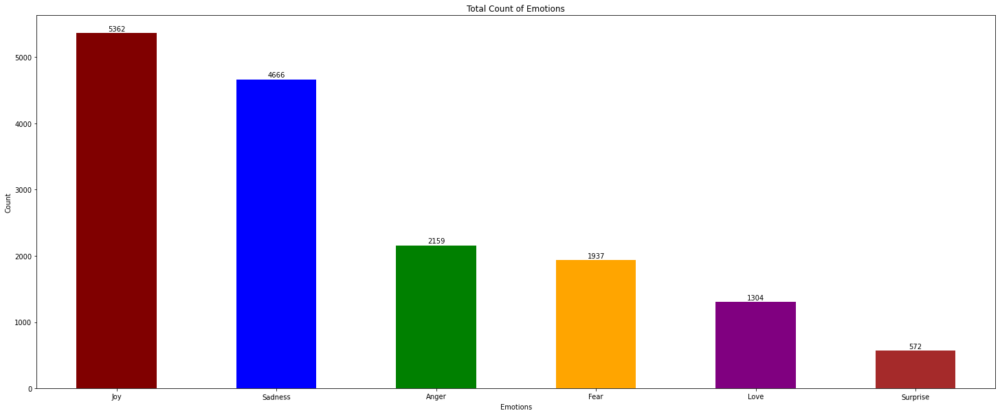

In [5]:
# Obtain the unique categories in the categorical variable emotion.
emotion = train_data["emotion"].value_counts()

# Plot configuration
plt.figure(figsize = (25, 10))
ax = emotion.plot(kind='bar', rot = 1, color=['maroon', 'blue', 'green', 'orange', 'purple', 'brown'])
ax.set_title("Total Count of Emotions", y = 1)
ax.set_xlabel('Emotions')
ax.set_ylabel('Count')
ax.set_xticklabels(('Joy', 'Sadness','Anger', 'Fear','Love', 'Surprise'))

for rect in ax.patches:
    y_value = rect.get_height()
    x_value = rect.get_x() + rect.get_width() / 2
    space = 1
    label = "{:.0f}".format(y_value)
    ax.annotate(label, (x_value, y_value), xytext=(0, space), 
                textcoords = "offset points", ha = 'center', va = 'bottom')

# Visualise the plot
plt.show()

The simple plot above shows the `6` different emotions plotted in descending order of their frequency in the train dataset. The count plot also further verifies that we have a dataset with having class imbalanced property. 

Let us dig a little deeper and check if there are any `suspicious texts` in our train dataset. We define suspicious texts as texts which contain `words which are extraordinary long`. This may indicate either a `typo` message, or a `spam` message. Either way, we ought to investigate these data before proceeding with cleaning our data.

In [6]:
avg_word_length = []
max_word_length = []

for sentence in train_data['text']:
    sentence_word_length = []
    count = 0
    for word in sentence.split():
        sentence_word_length.append(len(word))
        count += 1
    
    avg = 0
    max_length = 0
    for word_length in sentence_word_length:
        if word_length > max_length:
            max_length = word_length
        avg += word_length
    
    avg /= count
    avg_word_length.append(round(avg, 2))
    max_word_length.append(max_length)

print("The longest word in the train dataset has a character count of", max(max_word_length))


The longest word in the train dataset has a character count of 74


In the English language, the longest legitimate word has a character count of `45`. This implies that our train dataset contains illegitimate English words. We can perform further analysis to confirm this.

Text(0.5, 0, 'Max length of word in a data')

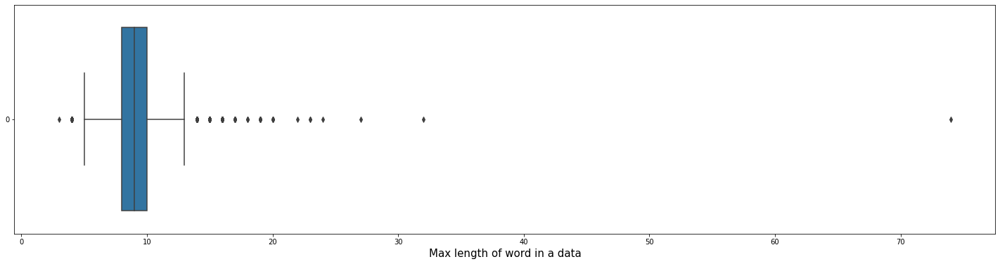

In [7]:
plt.figure(figsize = (25, 6))
sb.boxplot(data = max_word_length, orient = 'h')
plt.xlabel('Max length of word in a data', fontsize = 15)

Text(0.5, 0, 'Average length of words in a data')

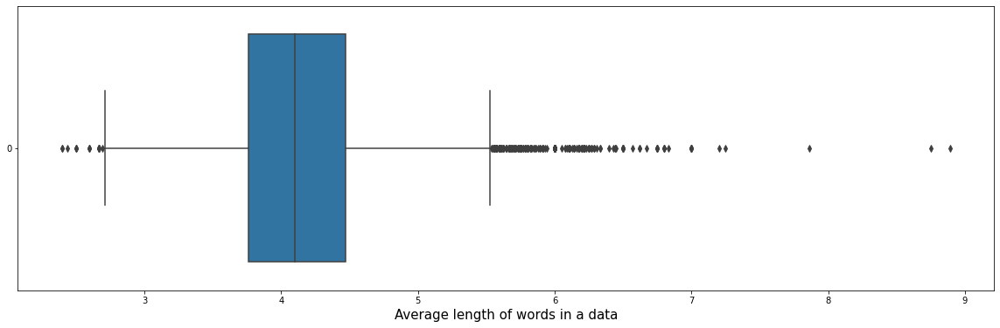

In [8]:
plt.figure(figsize = (20, 6))
sb.boxplot(data = avg_word_length, orient = 'h')
plt.xlabel('Average length of words in a data', fontsize = 15)

We see the 74-characters long word appear in the first boxplot (as indicated by the outlier at the 70+ range). Since the other words are lesser than 45 characters long, we decided not to remove the outlier as the impact towards the effectiveness of our model later on is negligence (1 data point out of 16,000 data points). 

We can also see that for most of our data, the average characters per word falls within the range of approximately 2 to 5.5, with some outliers having average characters per word up to 9. With that, we can hypothesize that we should be working on commonly used English words, judging by the average characters per word of our data alone.

Let us see if our hypothesis about working on commonly used English words is correct.

We will be using `WordCloud` as our primary mean of analysing our dataset as we progress. Thus, we have compiled the function to display the necessary Word Cloud into a library to allow ease of use in the later sections. We will need to import the required library before proceeding.

In [9]:
from Libraries import *

[nltk_data] Downloading package stopwords to C:\Users\MY
[nltk_data]     COMPUTER\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to C:\Users\MY
[nltk_data]     COMPUTER\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw-1.4 to C:\Users\MY
[nltk_data]     COMPUTER\AppData\Roaming\nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!
[nltk_data] Downloading package punkt to C:\Users\MY
[nltk_data]     COMPUTER\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


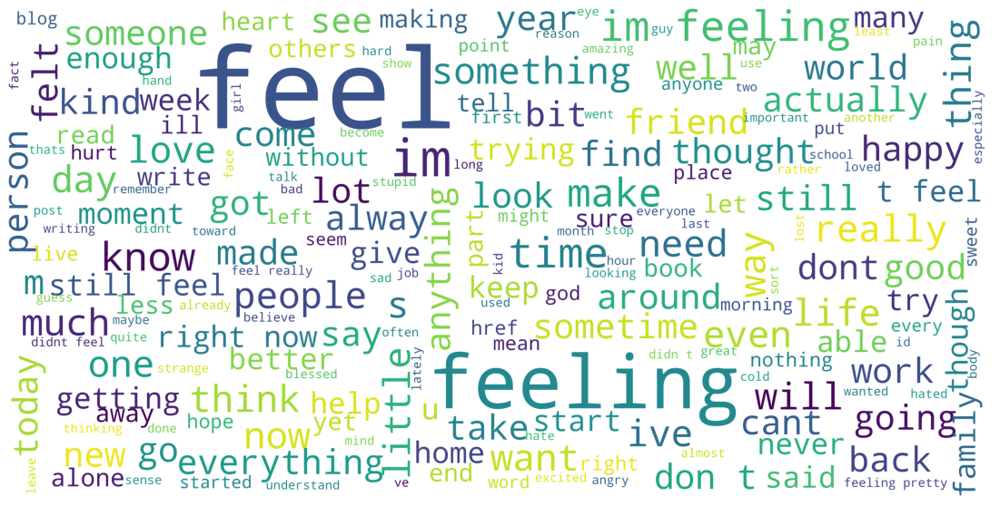

In [10]:
show_wordcloud(train_data, 'text', 'white', 200, 45, 30, (30, 10))

Indeed, from a quick glance at the word cloud alone, we can see words such as `feel`, `feeling`, `will`, `love`, etc., which are commonly used English words, that appear frequently in the train dataset. 

Here are further observations from the word cloud:
* We can see certain words such as `href` which is an html tag that appeared in the word cloud. This indicates we need to do some html tag removal during the cleaning phase of our dataset.
* There are words such as `dont` and `ive` which have no inherent emotion attached to them. We will need to remove these `stopwords` during the cleaning phase as well.
* There are also words which are different but carry the same meaning such as `feel` and `felt`. Thus we will have to perform `lemmatization` of words during the cleaning phase.

### Data Pre-processing: Investigate Duplicated Data

From the earlier observations, we note that there are a few data in the train dataset which are duplicated. This stems from the fact that certain words or even sentence can mean differently depending on the context and expression used when conveying the sentence.

For example, 'There is this irky feeling in me that I cannot describe..' can convey either `fear` or `surprise` emotion. 

Since we are dealing with text-based data, expression becomes ambiguous especially when it comes to sentence/words with duality/multiple meanings. Thus, we opt to keep the duplicated data with different emotions and only remove the data that are identical and share the same emotion.

We first pinpoint the data which are identical.

In [11]:
duplicated = []
loc = 0
for sentence in train_data.duplicated(subset = ['text']):
    if sentence == True:
        duplicated.append(loc)
    loc += 1

dup1 = []
dup2 = []
text = []
for index in duplicated:
    for i in range(0, index - 1):
        if (train_data['text'].iloc[i] == train_data['text'].iloc[index]):
            dup1.append(train_data['emotion'].iloc[i])
            dup2.append(train_data['emotion'].iloc[index])
            text.append(train_data['text'].iloc[i])

dup_df = pd.DataFrame()
dup_df['text'] = text
dup_df['emotion 1'] = dup1
dup_df['emotion 2'] = dup2

dup_df.head(n = 31)

,text,emotion 1,emotion 2
0,i feel on the verge of tears from weariness i ...,love,joy
1,i still feel a craving for sweet food,joy,love
2,i tend to stop breathing when i m feeling stre...,sadness,anger
3,i was intensely conscious of how much cash i h...,anger,sadness
4,im still not sure why reilly feels the need to...,fear,surprise
5,i am not amazing or great at photography but i...,joy,love
6,ive also made it with both sugar measurements ...,love,joy
7,i had to choose the sleek and smoother feel of...,love,joy
8,i often find myself feeling assaulted by a mul...,fear,sadness
9,i feel im being generous with that statement,love,joy


From inspection we can already see that given a different context, the duplicated sentence having two different emotions make total sense. Thus, we will not be removing these datas for now, to see how our model performs when tested against the validation dataset.

We will however, be removing data 20 as it has the same data and emotion shared by 2 data entries in the train dataset.

In [12]:
train_data = train_data.drop([duplicated[20]])

train_data.describe()

,text,emotion
count,15999,15999
unique,15969,6
top,i feel on the verge of tears from weariness i ...,joy
freq,2,5361


### Data Pre-processing: Cleaning Train Dataset

Before we begin the cleaning phase, we will need to import the essential libraries. 
> [nltk](https://www.nltk.org) will be our de-facto dataset cleaning library.

We have compiled some useful functions for data cleaning to allow ease of use later on for the test and validation datasets. These functions can be found in our custom library. They are
> * lemmatizeWords() <br>
> * removeStopwords() <br>
> * remove_html_attr() <br>
> * extend_word()

We will start by performing the lemmatizing of words.

In [13]:
train_data = lemmatizeWords(train_data, 'text', 'clean_text')

Let us view the summary of our lemmatized words.

In [14]:
train_data['clean_text'].head()

0                              i didnt feel humiliated
1    i can go from feeling so hopeless to so damned...
2     im grabbing a minute to post i feel greedy wrong
3    i am ever feeling nostalgic about the fireplac...
4                                 i am feeling grouchy
Name: clean_text, dtype: object

We can visualise the words used in the train dataset after lemmetization to see the changes.

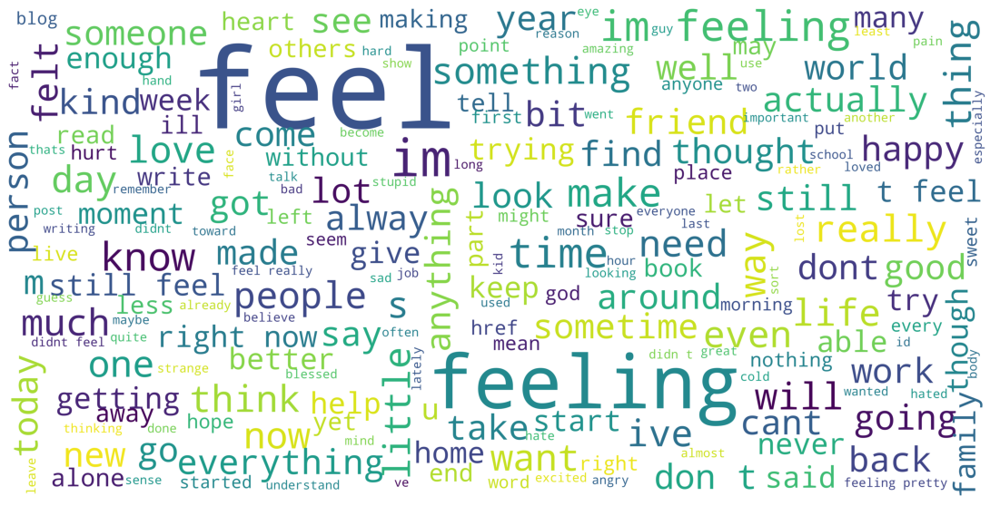

In [15]:
show_wordcloud(train_data, 'clean_text', 'white', 200, 45, 25, (30, 10))

We note that word such as `feeling` still remain even after we performed lemmatization. The reason is that `feeling` can be an adjective instead of a continuous tense, i.e. 'Our feelings matter a lot'. `nltk`'s WordLemmatizer classifies words into their respective `part-of-speech` before deciding whether it is appropriate to lemmatize them.

Now we begin phase 2 of cleaning the dataset by removing all html tags and attributes.

In [16]:
# Retrieve all html tags and attribute
html_keys = get_html_keys()

html_removed = []

for sentence in train_data['clean_text']:
    # Remove any html tags and attribute that are in the sentence
    sentence = remove_html_attr(sentence, html_keys = html_keys)
    html_removed.append(sentence)

train_data['clean_text'] = html_removed

We can visualise the changes using word cloud once again.

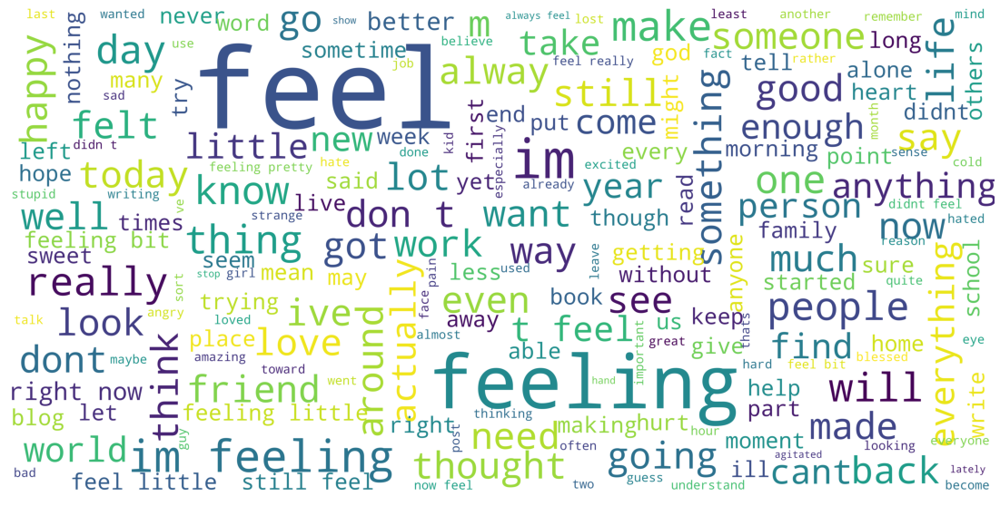

In [17]:
show_wordcloud(train_data, 'clean_text', 'white', 200, 45, 25, (30, 10))

We can clearly see that words such as `href` has been removed.

Next, we will be removing stopwords from our dataset. This will be the last cleaning phase.

Before we begin the last cleaning phase, we can see that some words such as `dont` have a missing apostrophe. However, `nltk` set of stopwords does not account for this special case. Thus, we will need to extend the word out. We have created a function to perform the extension of words inside our custom library. The extension will be done together along with the removal of stopwords.

Now we can begin removing the stopwords.

In [18]:
(outlier, train_data['clean_text']) = removeStopWords(train_data, 'clean_text')

# Remove the outliers from dataset
train_data = train_data.drop([train_data.index[loc] for loc in outlier])

We can visualise the data after stopwords removal using word cloud.

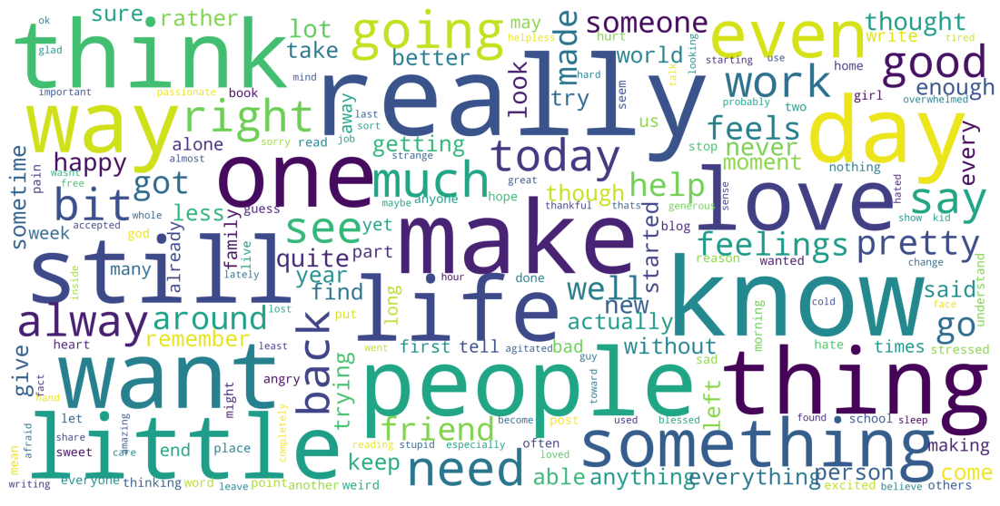

In [19]:
show_wordcloud(train_data, 'clean_text', 'white', 200, 45, 25, (30, 10))

It is more helpful to visualise the Word Cloud of each emotion. We can also go a step further and view the Word Cloud prior to data cleaning to see the **before** and **after** effects of our data cleaning.

Anger (before data cleaning)


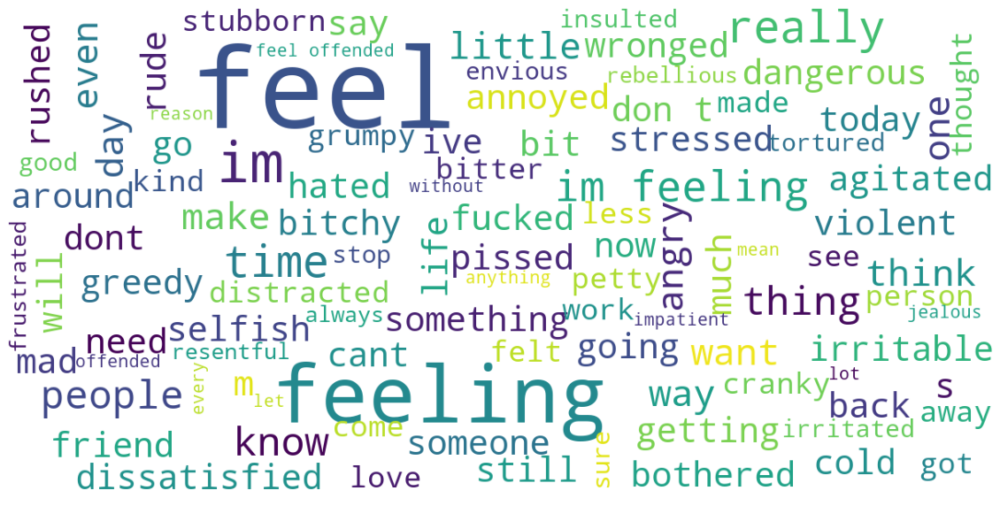

Anger (after data cleaning)


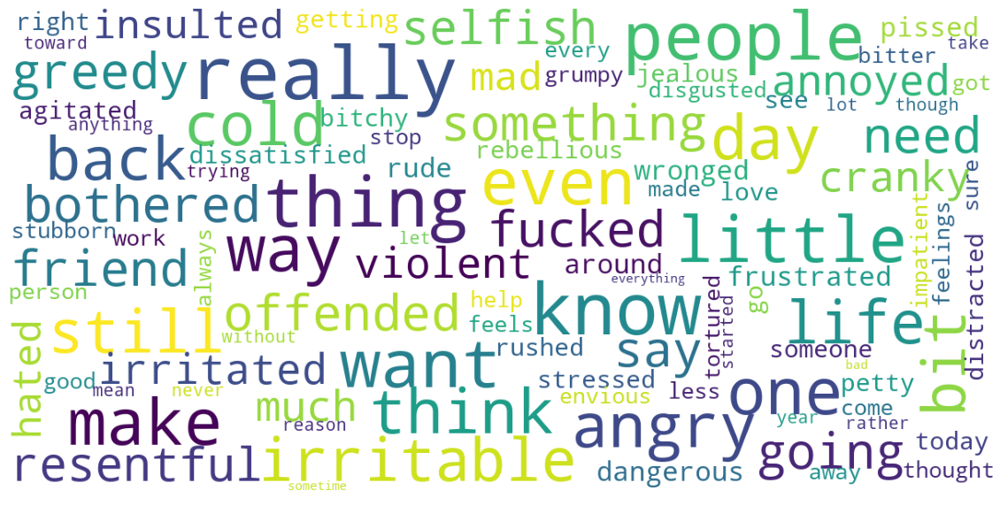

Fear (before data cleaning)


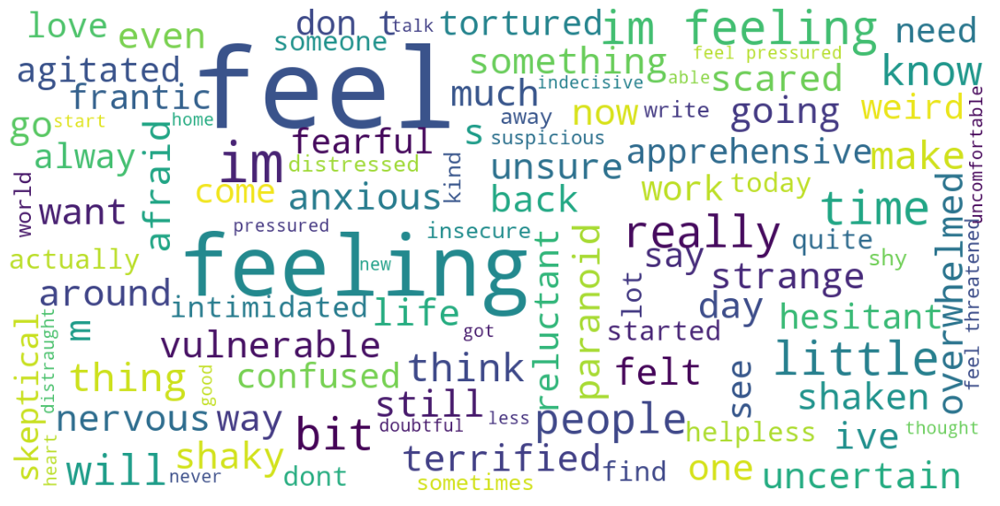

Fear (after data cleaning)


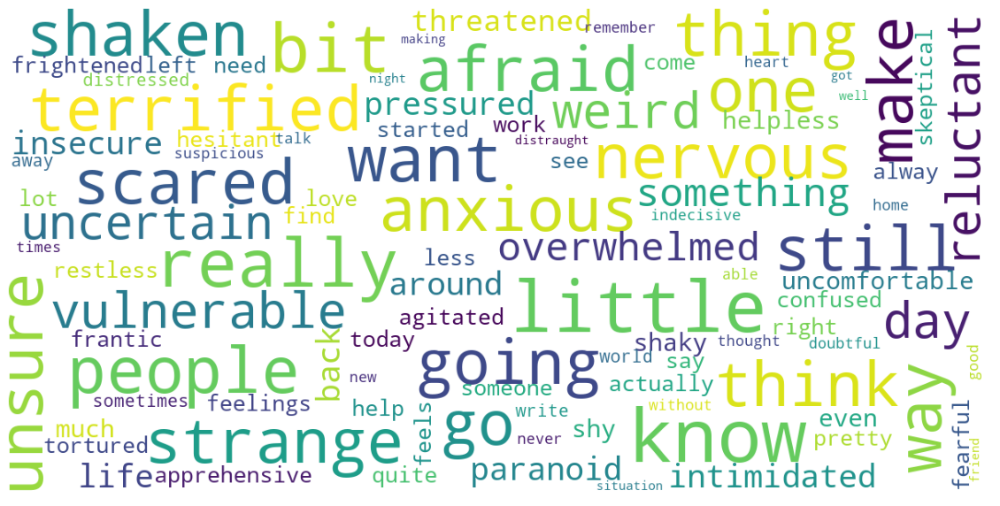

Joy (before data cleaning)


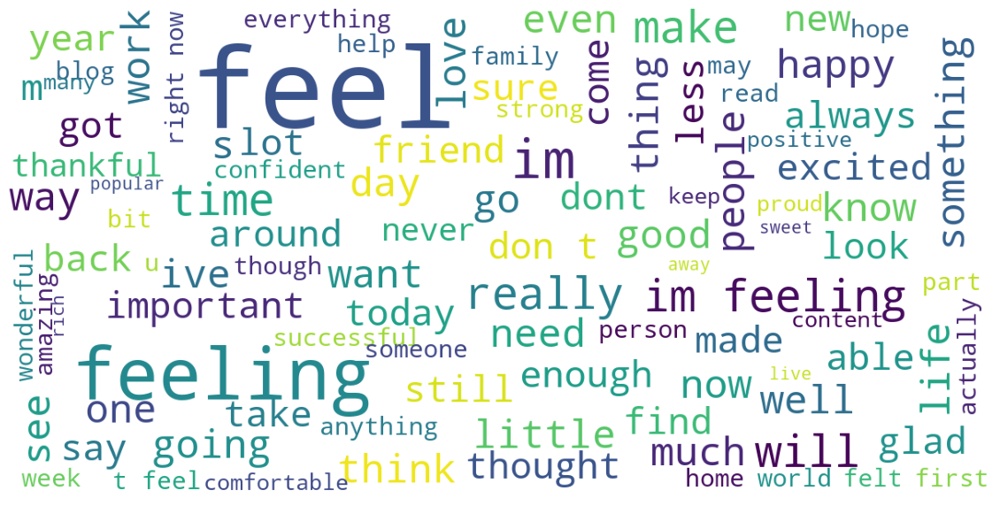

Joy (after data cleaning)


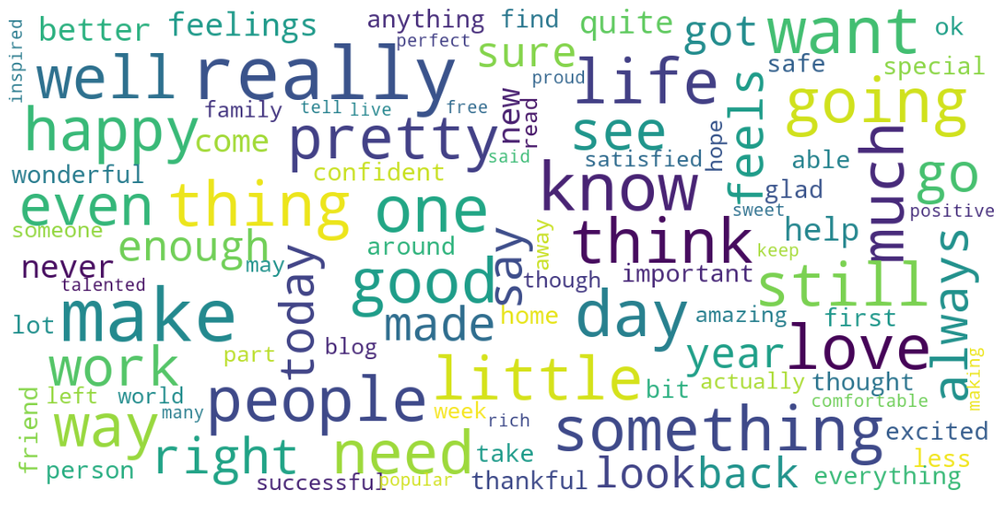

Love (before data cleaning)


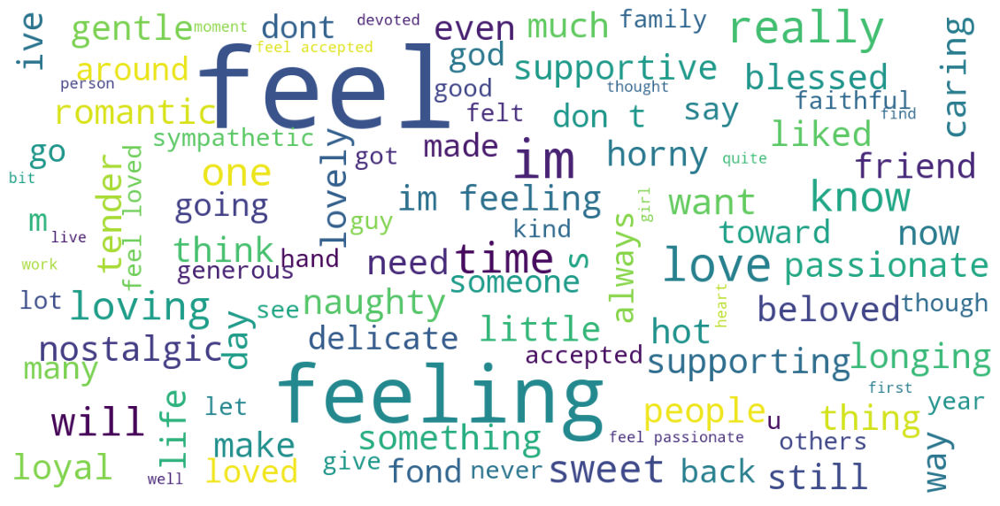

Love (after data cleaning)


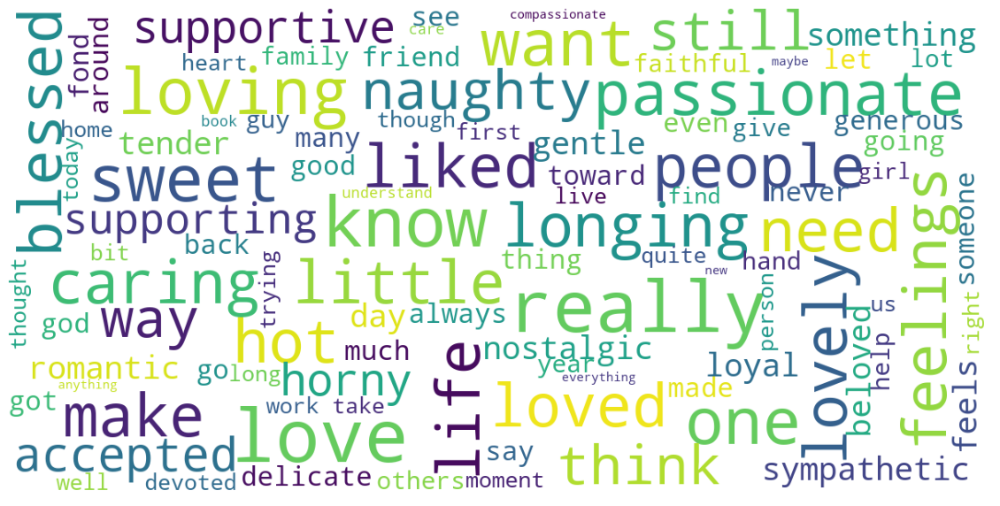

Sadness (before data cleaning)


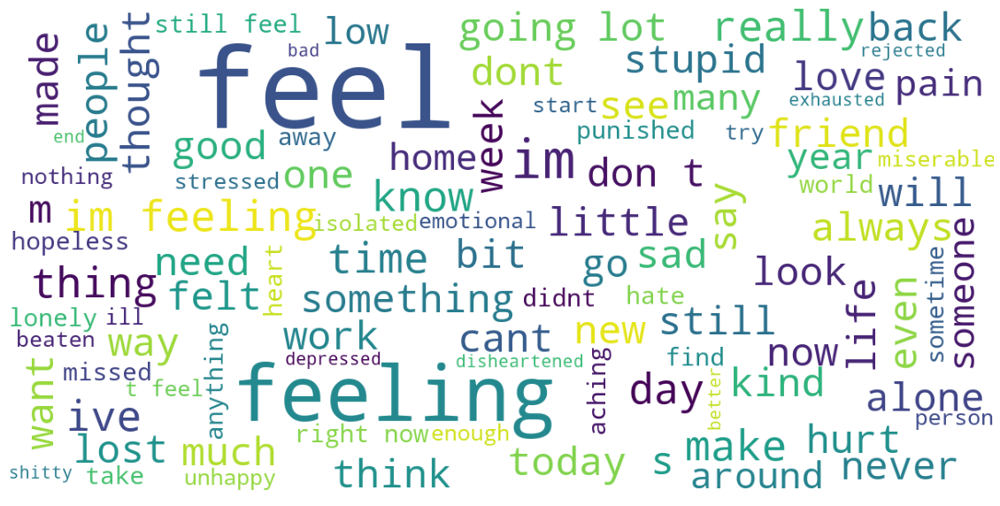

Sadness (after data cleaning)


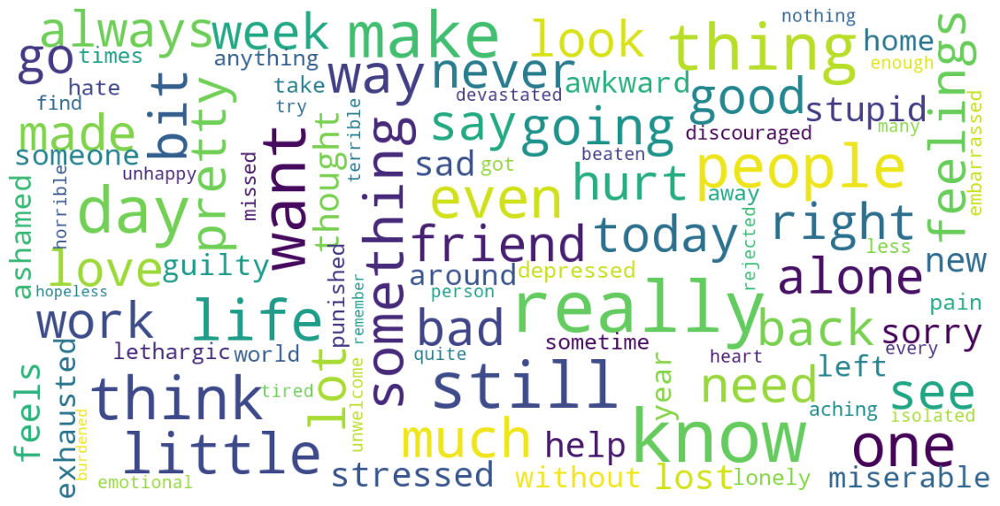

Surprise (before data cleaning)


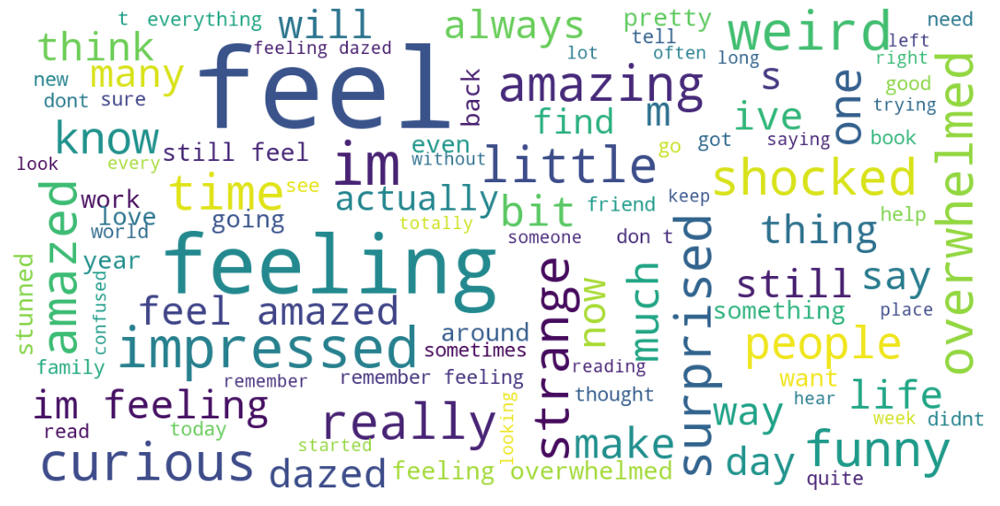

Surprise (after data cleaning)


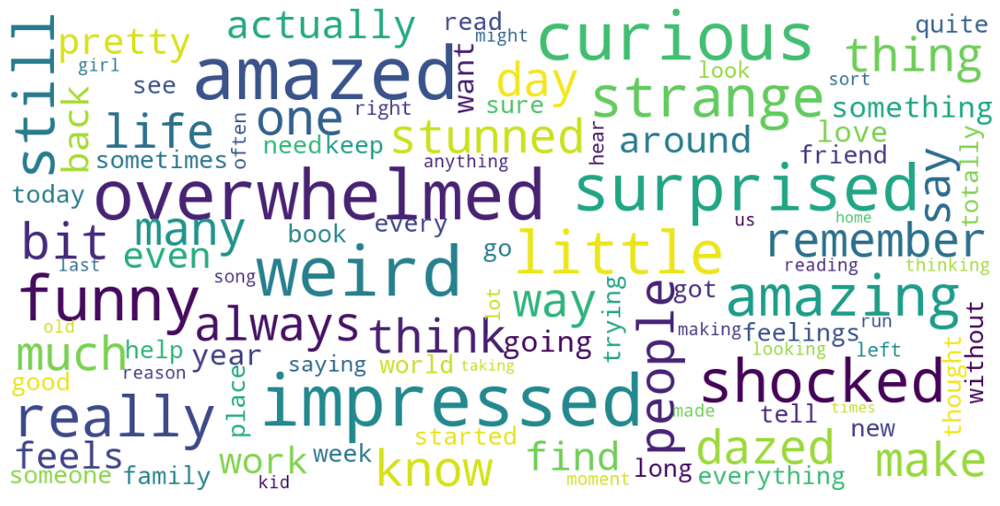

In [20]:
for i in pd.Categorical(train_data['emotion']).categories:
    df = train_data[train_data['emotion'] == i]
    print(str(i).capitalize(), "(before data cleaning)")
    show_wordcloud(df, 'text', 'white', 100, 45, 3, (20, 20))
    print(str(i).capitalize(), "(after data cleaning)")
    show_wordcloud(df, 'clean_text', 'white', 100, 30, 3, (20, 20))

We can further explore on our dataset to gain further insights. Let us try and see if there is any relation between the number of words in a sentence vs emotion, i.e., is it possible that angry sentence tend to be longer? Let us find out!

In [21]:
temp_dct = {}

for sentence in train_data['text']:
    if train_data.loc[train_data['text'] == sentence, 'emotion'].iloc[0] not in temp_dct.keys():
        temp_dct[train_data.loc[train_data['text'] == sentence, 'emotion'].iloc[0]] = []
    
    temp_dct[train_data.loc[train_data['text'] == sentence, 'emotion'].iloc[0]].append(len(sentence.split()))

temp2_dct = {}
for i in temp_dct:
    sum = 0
    for j in temp_dct[i]:
        sum += j
    
    avg = sum / len(temp_dct[i])
    temp2_dct[i] = round(avg, 2)

    sum = 0

temp_dct.update(temp2_dct)

temp_df = pd.DataFrame.from_dict(temp_dct, orient='index', 
                                columns = ['average word count']).sort_values('average word count', 
                                ascending = True)

temp_df.head(n = 6)

,average word count
sadness,18.36
fear,18.81
anger,19.25
joy,19.50
surprise,20.04
love,20.70


We can plot out the average word count for each emotion in a bar plot.

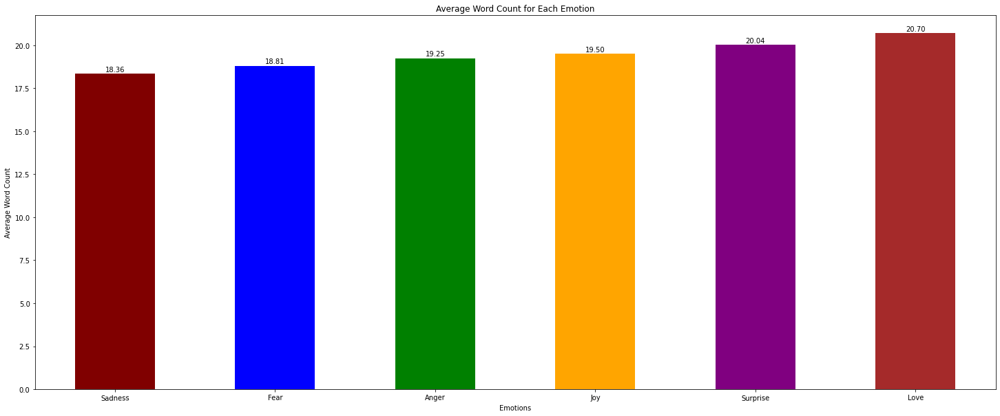

In [22]:
# Plot configuration
plt.figure(figsize = (25, 10))
ax = temp_df['average word count'].plot(kind='bar', rot = 1, 
                                        color=['maroon', 'blue', 'green', 'orange', 'purple', 'brown'])
ax.set_title("Average Word Count for Each Emotion", y = 1)
ax.set_xlabel('Emotions')
ax.set_ylabel('Average Word Count')
ax.set_xticklabels(('Sadness', 'Fear','Anger', 'Joy', 'Surprise', 'Love'))

for rect in ax.patches:
    y_value = rect.get_height()
    x_value = rect.get_x() + rect.get_width() / 2
    space = 1
    label = "{:.2f}".format(y_value)
    ax.annotate(label, (x_value, y_value), xytext=(0, space), 
                textcoords = "offset points", ha = 'center', va = 'bottom')

# Visualise the plot
plt.show()

From what we observe, there is a slight relation between the word count with emotion. The only observation we can make is that negative sentiments (**sadness**, **fear** and **anger**) tend to have slightly lesser word count compared to positive sentiments (**joy**, **surprise** and **love**).

Though we have been investigating the unclean dataset. Thus there may be some `dirt` in our dataset that is influencing our observations. Let us see if the trend changes if we investigate the cleaned dataset.

In [23]:
temp_dct = {}

for sentence in train_data['clean_text']:
    if train_data.loc[train_data['clean_text'] == sentence, 'emotion'].iloc[0] not in temp_dct.keys():
        temp_dct[train_data.loc[train_data['clean_text'] == sentence, 'emotion'].iloc[0]] = []
    
    temp_dct[train_data.loc[train_data['clean_text'] == sentence, 'emotion'].iloc[0]].append(len(sentence.split()))

temp2_dct = {}
for i in temp_dct:
    sum = 0
    for j in temp_dct[i]:
        sum += j
    
    avg = sum / len(temp_dct[i])
    temp2_dct[i] = round(avg, 2)

    sum = 0

temp_dct.update(temp2_dct)

temp_df = pd.DataFrame.from_dict(temp_dct, orient='index', 
                                columns = ['average word count']).sort_values('average word count', 
                                ascending = True)

temp_df.head(n = 6)

,average word count
sadness,7.47
fear,7.70
anger,7.81
joy,8.00
surprise,8.26
love,8.42


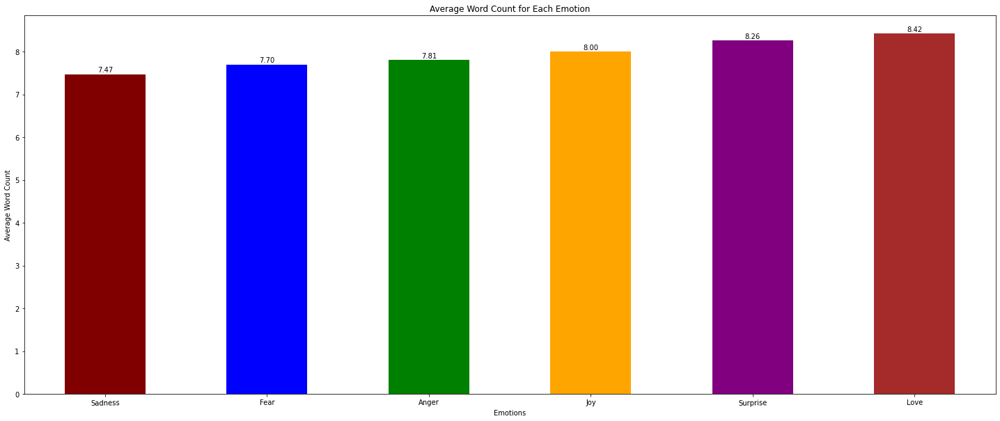

In [24]:
# Plot configuration
plt.figure(figsize = (25, 10))
ax = temp_df['average word count'].plot(kind='bar', rot = 1, 
                                        color=['maroon', 'blue', 'green', 'orange', 'purple', 'brown'])
ax.set_title("Average Word Count for Each Emotion", y = 1)
ax.set_xlabel('Emotions')
ax.set_ylabel('Average Word Count')
ax.set_xticklabels(('Sadness', 'Fear','Anger', 'Joy', 'Surprise', 'Love'))

for rect in ax.patches:
    y_value = rect.get_height()
    x_value = rect.get_x() + rect.get_width() / 2
    space = 1
    label = "{:.2f}".format(y_value)
    ax.annotate(label, (x_value, y_value), xytext=(0, space), 
                textcoords = "offset points", ha = 'center', va = 'bottom')

# Visualise the plot
plt.show()

We still see the similar trend that negative sentiments are slightly lower in word count when compared to positive sentiments. Here are a few inferences we can make:
* The number of stopwords and html tags in each data points are roughly equivalent.
* Our method of cleaning the dataset is effective as of now, otherwise there may be the case where we might **overclean** a particular emotion until its average word count drops out of the trend. Though we cannot conclude this 100% yet, we will have to see how our choice of models hold up in the Machine Learning portion.

The WordCloud may be a little overwhelming to digest the common words that appear in each emotion. Let us attempt to plot out the most commonly used words for each emotion **before** and **after** the cleaning using a bar plot.

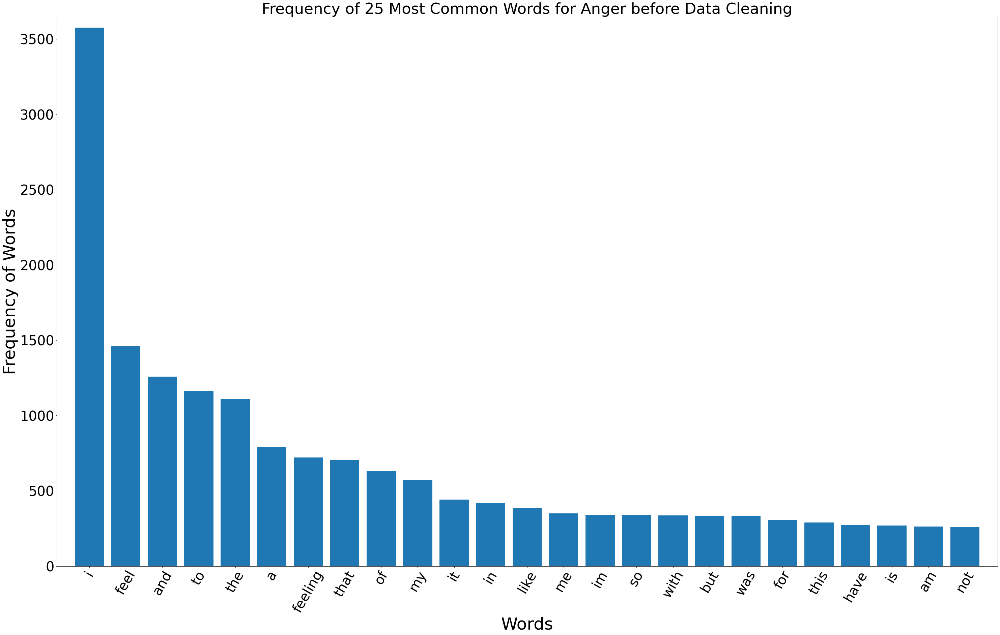

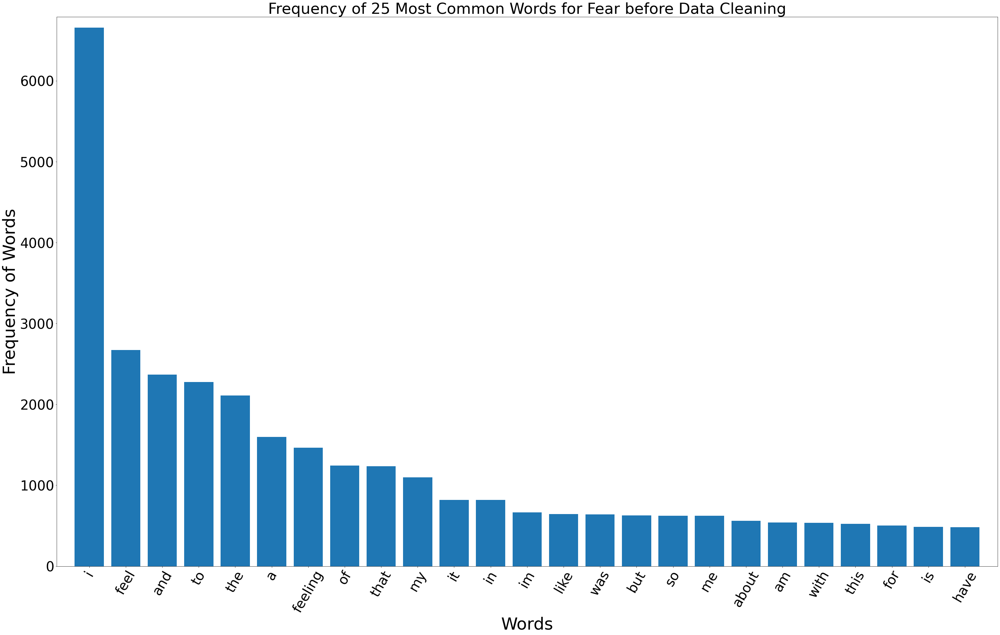

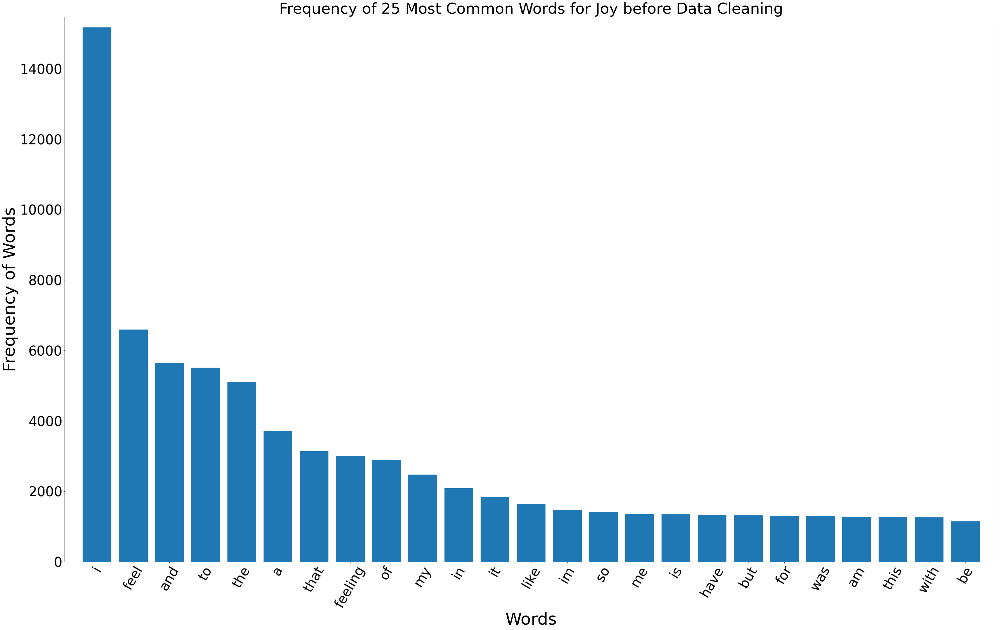

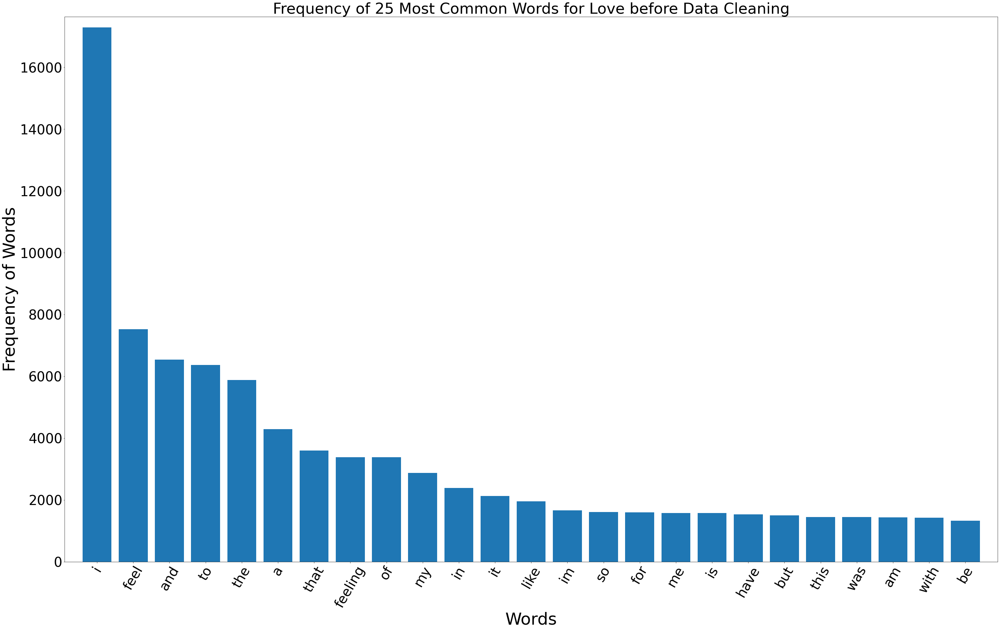

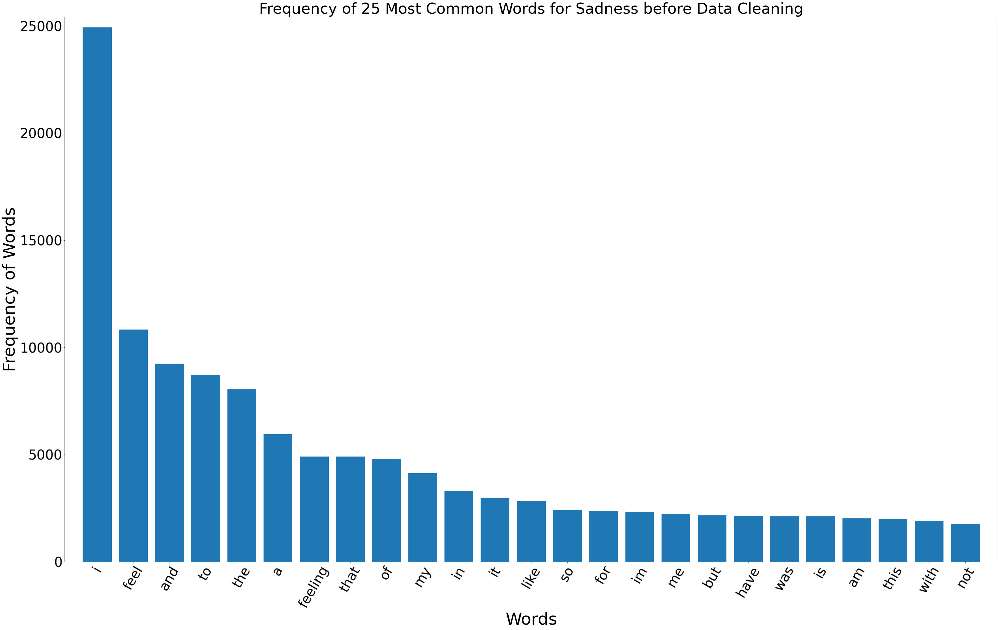

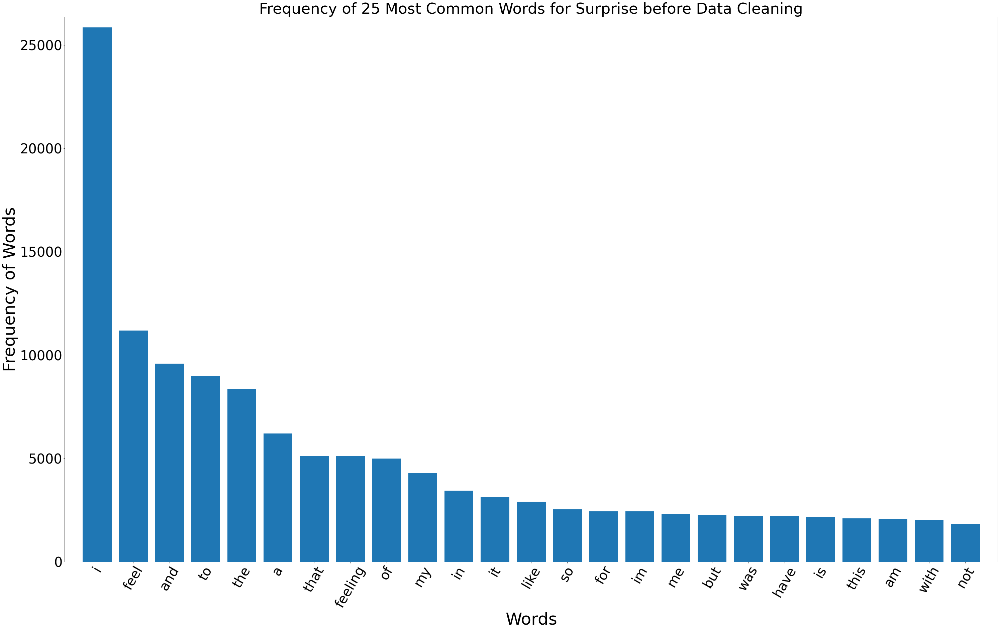

In [25]:
from nltk.probability import FreqDist

allwords = []

for i in pd.Categorical(train_data['emotion']).categories:
    for sentence in train_data.loc[train_data['emotion'] == i, 'text']:
        allwords += sentence.split()

    mostCommon = FreqDist(allwords).most_common(25)

    x, y = zip(*mostCommon)
    plt.figure(figsize=(50,30))
    plt.margins(0.02)
    plt.bar(x, y)
    plt.xlabel('Words', fontsize=50)
    plt.ylabel('Frequency of Words', fontsize=50)
    plt.yticks(fontsize=40)
    plt.xticks(rotation=60, fontsize=40)
    plt.title('Frequency of 25 Most Common Words for %s before Data Cleaning' %i.capitalize(), fontsize=45)
    plt.show()

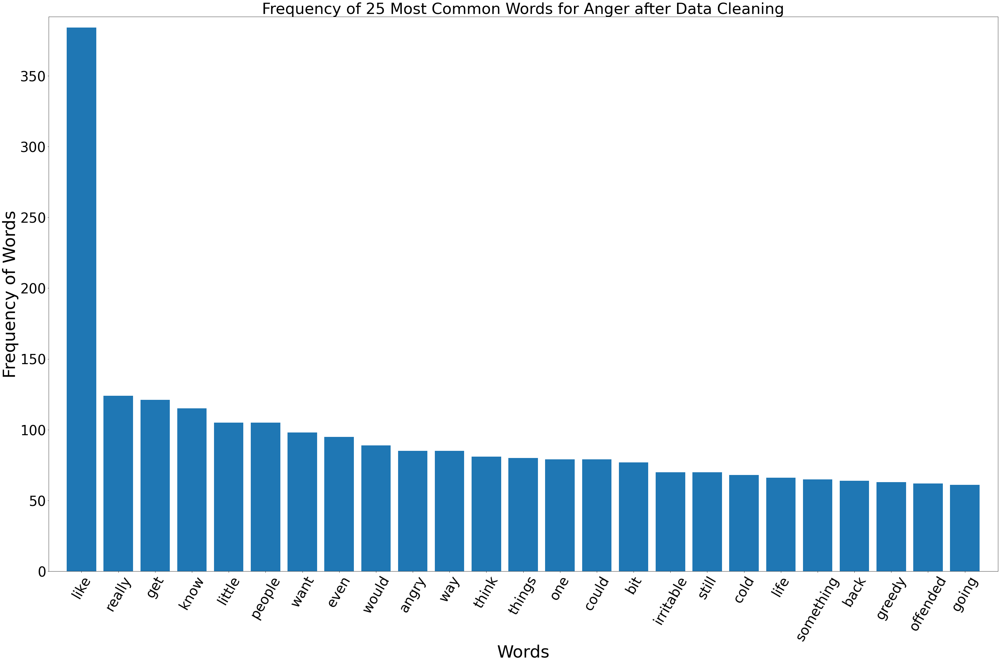

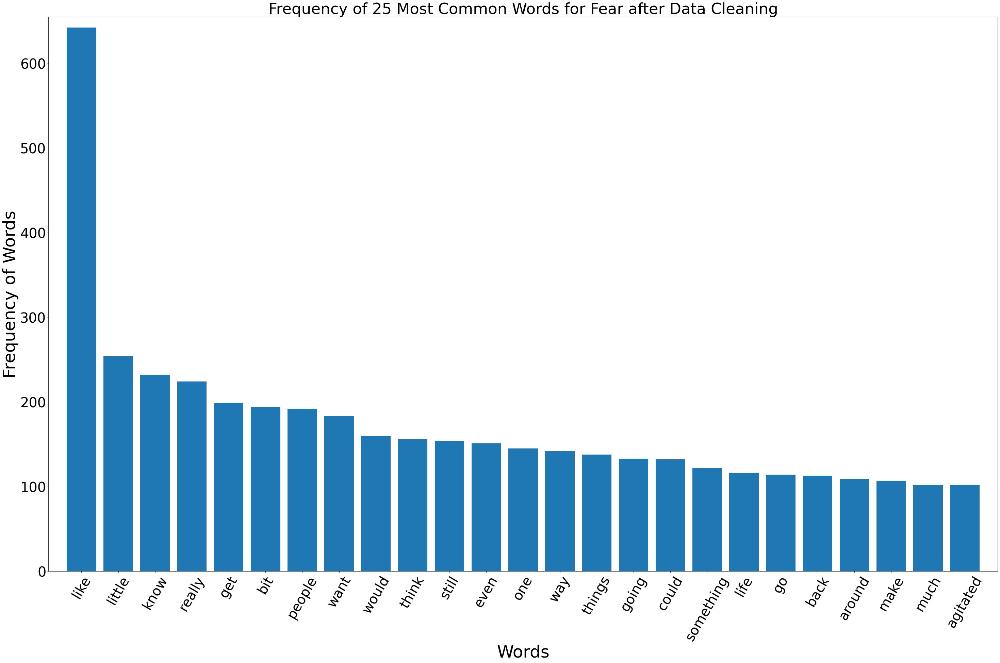

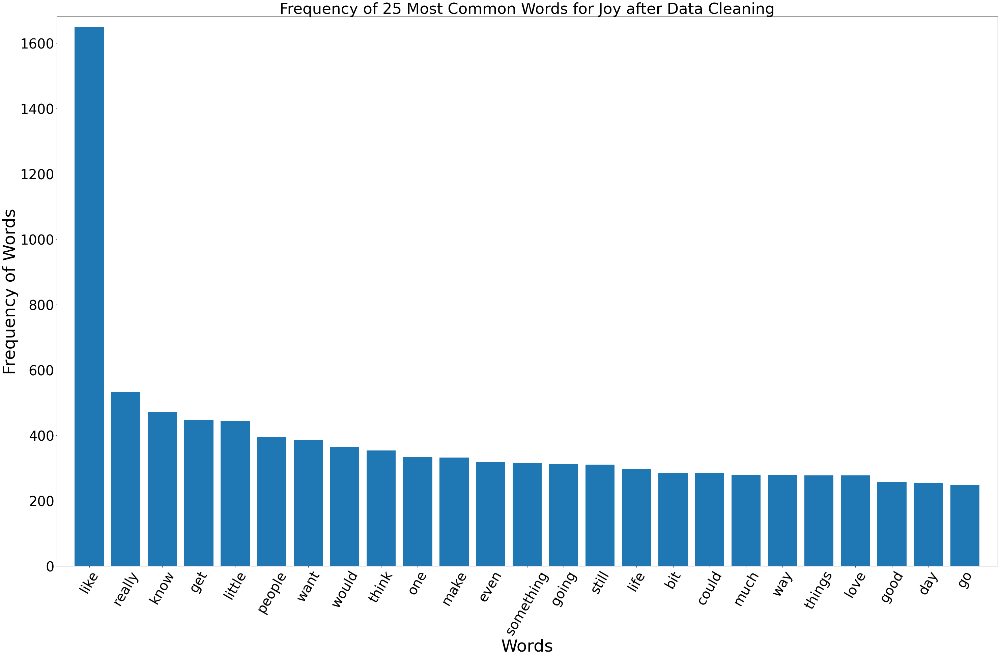

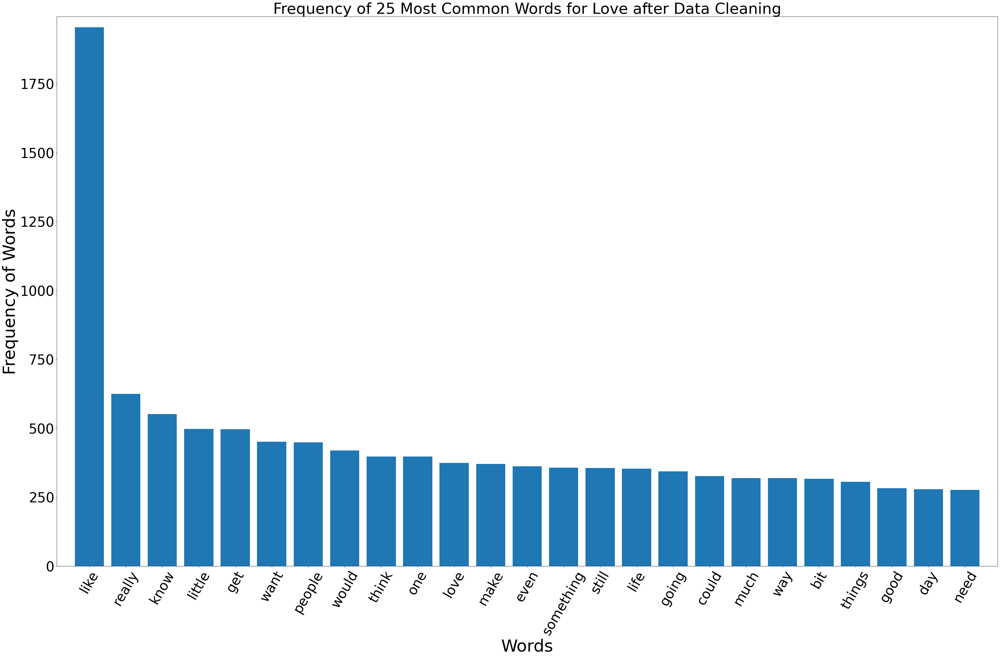

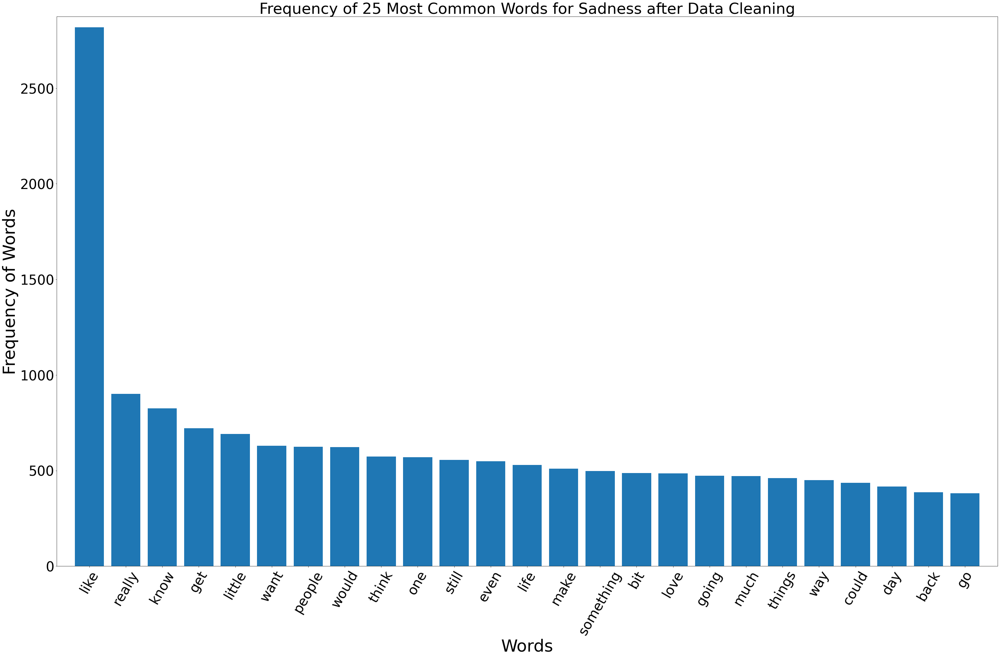

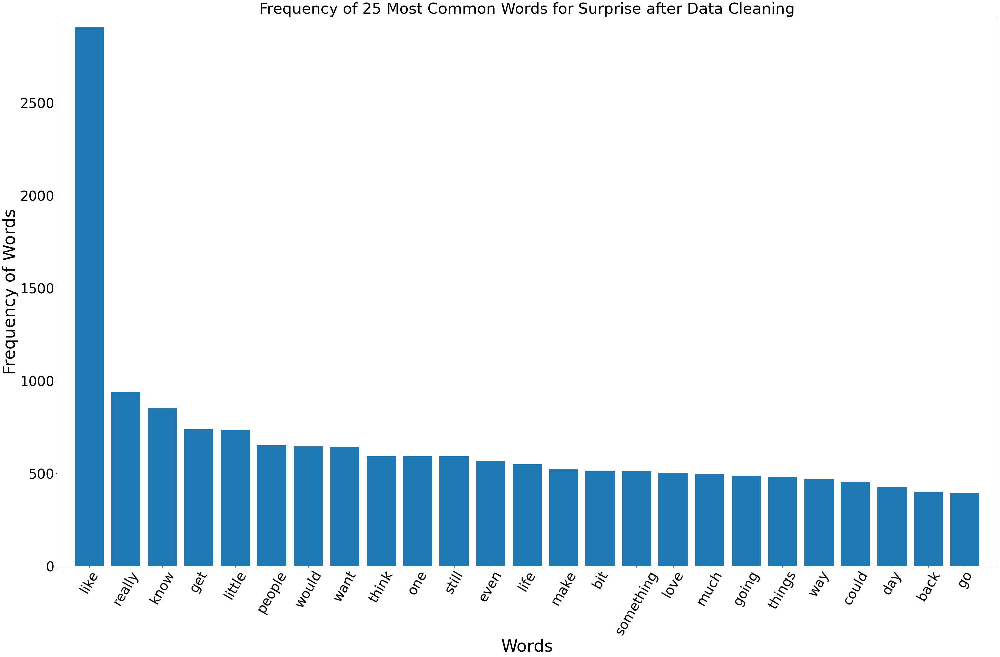

In [56]:
allwords = []

for i in pd.Categorical(train_data['emotion']).categories:
    for sentence in train_data.loc[train_data['emotion'] == i, 'clean_text']:
        allwords += sentence.split()

    mostCommon = FreqDist(allwords).most_common(25)

    x, y = zip(*mostCommon)
    plt.figure(figsize=(50,30))
    plt.margins(0.02)
    plt.bar(x, y)
    plt.xlabel('Words', fontsize=50)
    plt.ylabel('Frequency of Words', fontsize=50)
    plt.yticks(fontsize=40)
    plt.xticks(rotation=60, fontsize=40)
    plt.title('Frequency of 25 Most Common Words for %s after Data Cleaning' %i.capitalize(), fontsize=45)
    plt.show()

---

# Machine Learning

### Logistic Regression (Model 1)

We will be using `Logistic Regression` as our first choice of modelling.

In [27]:
from sklearn.pipeline import Pipeline
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix

import pandas as pd
import numpy as np

We have created an object class inside our custom library that contains methods which will train and fit, as well as predict our model's classification accuracy.

C:\Users\MY COMPUTER\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


The classification accuracy is:  0.9832458114528632

The average F1-score: 0.98


,Emotion,Precision,Recall,F1-score
0,anger,0.982751,0.976378,0.979554
1,fear,0.975232,0.975736,0.975484
2,joy,0.985335,0.990299,0.987811
3,love,0.979021,0.966258,0.972597
4,sadness,0.987155,0.988636,0.987895
5,surprise,0.970070,0.963287,0.966667


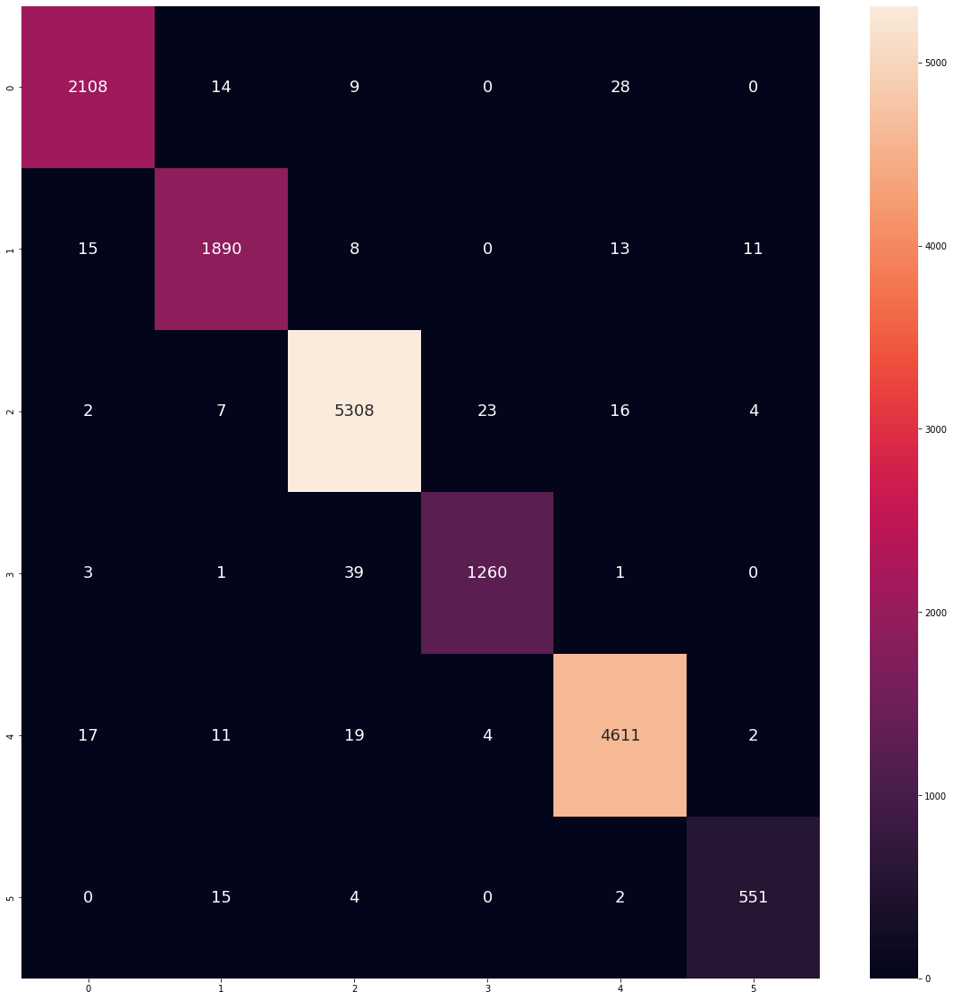

In [28]:
Model_1 = NLPModel(train_data, LogisticRegression(), 'lr', 'clean_text', 'emotion')
(x_train, y_train) = Model_1.getLabels()
pipeline_1 = Model_1.buildPipeline()
pipeline_1 = Model_1.fitModel(pipeline_1, x_train, y_train)
(prediction, predScore) = Model_1.score(pipeline_1, x_train, y_train)

CM = Model_1.buildCM(prediction, y_train)

Model_1.printCM(CM)
score_df = Model_1.printScore(predScore, CM)

avg = 0
for score in score_df['F1-score']:
    avg += score

avg /= 6

print("The average F1-score: %s" %round(avg, 2))


avg_train_data = []
avg_train_data.append(avg)
score_df.head(n = 6)

Now, we will be testing our `Logistic Regression` model on the validation dataset to see how it performs.

First, we have to import and perform the data cleaning on the validation dataset

In [29]:
val_data = pd.read_csv("datasets/val.txt", sep = ';')

val_data = lemmatizeWords(val_data, 'text', 'clean_text')

html_removed = []

for sentence in val_data['clean_text']:
    # Remove any html tags and attribute that are in the sentence
    sentence = remove_html_attr(sentence, html_keys = html_keys)
    html_removed.append(sentence)

val_data['clean_text'] = html_removed

(outlier, val_data['clean_text']) = removeStopWords(val_data, 'clean_text')

# Remove the outliers from dataset
val_data = val_data.drop([val_data.index[loc] for loc in outlier])

We will proceed to fit our model on the validation dataset and see how well it performs.

The classification accuracy is:  0.8984492246123061

The average F1-score: 0.87


,Emotion,Precision,Recall,F1-score
0,anger,0.914179,0.890909,0.902394
1,fear,0.862069,0.825472,0.843373
2,joy,0.910615,0.927454,0.918957
3,love,0.844828,0.825843,0.835227
4,sadness,0.918004,0.936364,0.927093
5,surprise,0.805195,0.765432,0.784810


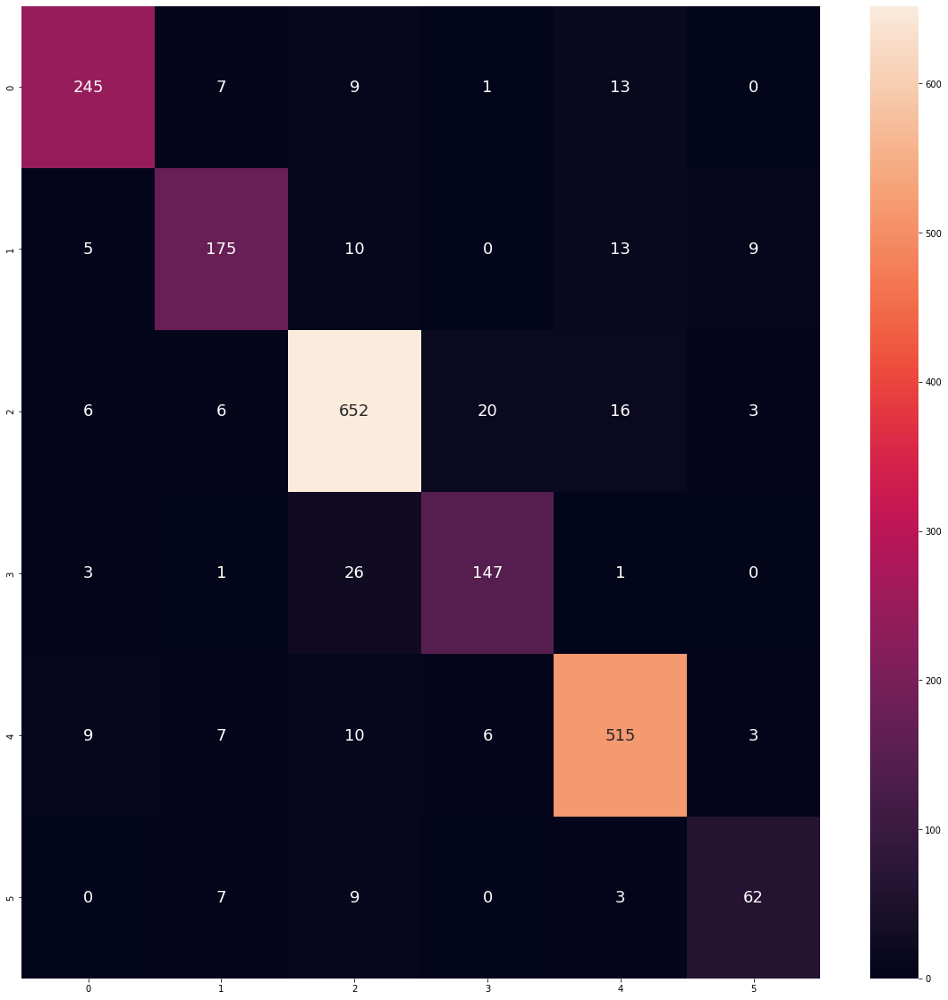

In [30]:
xLabel = val_data['clean_text']
yLabel = val_data['emotion']
(prediction, predScore) = Model_1.score(pipeline_1, xLabel, yLabel)

CM = Model_1.buildCM(prediction, yLabel)
Model_1.printCM(CM)
score_df = Model_1.printScore(predScore, CM)

avg = 0
for score in score_df['F1-score']:
    avg += score

avg /= 6

print("The average F1-score: %s" %round(avg, 2))


avg_val_data = []
avg_val_data.append(avg)
score_df.head(n = 6)

### Naive Bayes Algorithm (Model 2)

Nevertheless, let us try and see if `Naive Bayes Algorithm` can outperform `Logistic Regression` in predicting the emotion of our data.

In [31]:
from sklearn.naive_bayes import MultinomialNB

We will start with the train dataset.

The classification accuracy is:  0.9149162290572643

The average F1-score: 0.86


,Emotion,Precision,Recall,F1-score
0,anger,0.972124,0.888374,0.928364
1,fear,0.937257,0.871451,0.903157
2,joy,0.891887,0.980410,0.934056
3,love,0.986871,0.691718,0.813345
4,sadness,0.894522,0.987350,0.938647
5,surprise,0.996269,0.466783,0.635714


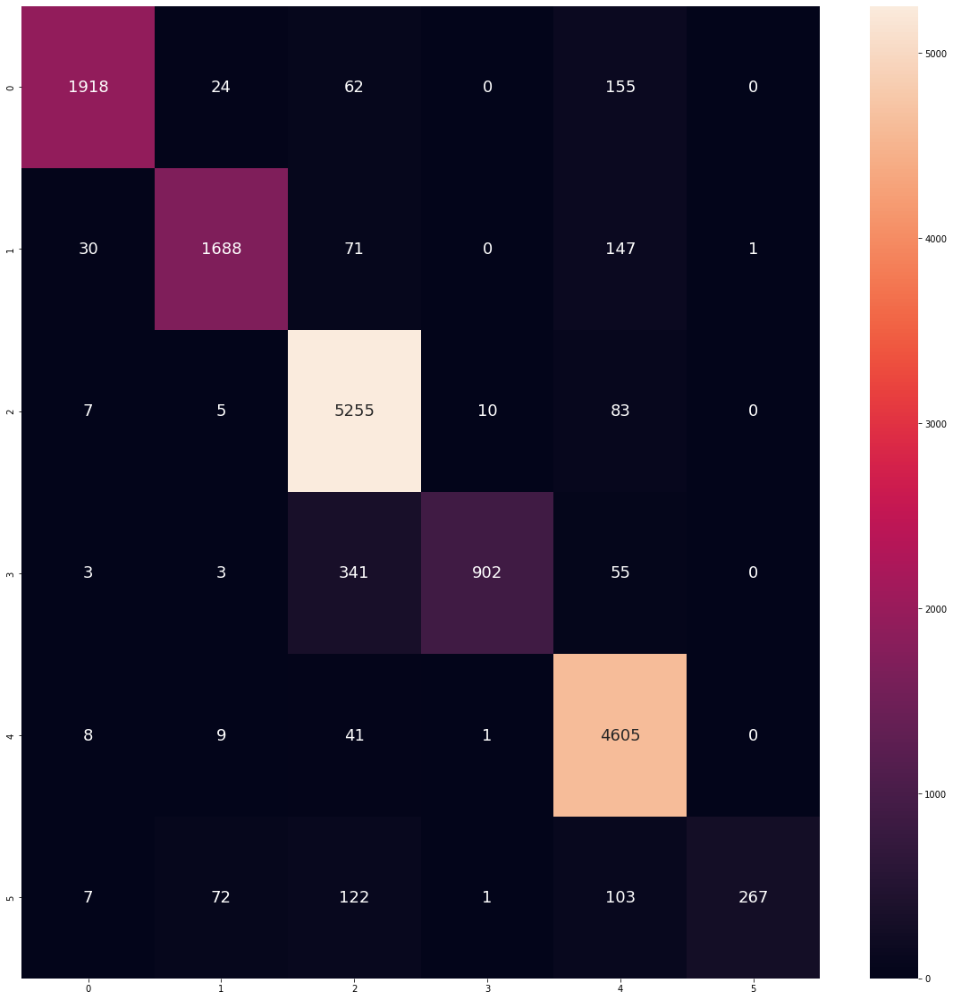

In [32]:
Model_2 = NLPModel(train_data, MultinomialNB(), 'nb', 'clean_text', 'emotion')
(x_train, y_train) = Model_2.getLabels()
pipeline_2 = Model_2.buildPipeline()
pipeline_2 = Model_2.fitModel(pipeline_2, x_train, y_train)
(prediction, predScore) = Model_2.score(pipeline_2, x_train, y_train)

CM = Model_2.buildCM(prediction, y_train)

Model_2.printCM(CM)
score_df = Model_2.printScore(predScore, CM)

avg = 0
for score in score_df['F1-score']:
    avg += score

avg /= 6

print("The average F1-score: %s" %round(avg, 2))


avg_train_data.append(avg)
score_df.head(n = 6)

Now, we will be testing our `Naive Bayes Algorithm` model on the validation dataset to see how it performs. 

The classification accuracy is:  0.7988994497248624

The average F1-score: 0.69


,Emotion,Precision,Recall,F1-score
0,anger,0.913876,0.694545,0.789256
1,fear,0.866667,0.674528,0.758621
2,joy,0.797576,0.935989,0.861257
3,love,0.934211,0.398876,0.559055
4,sadness,0.734665,0.936364,0.823341
5,surprise,0.826087,0.234568,0.365385


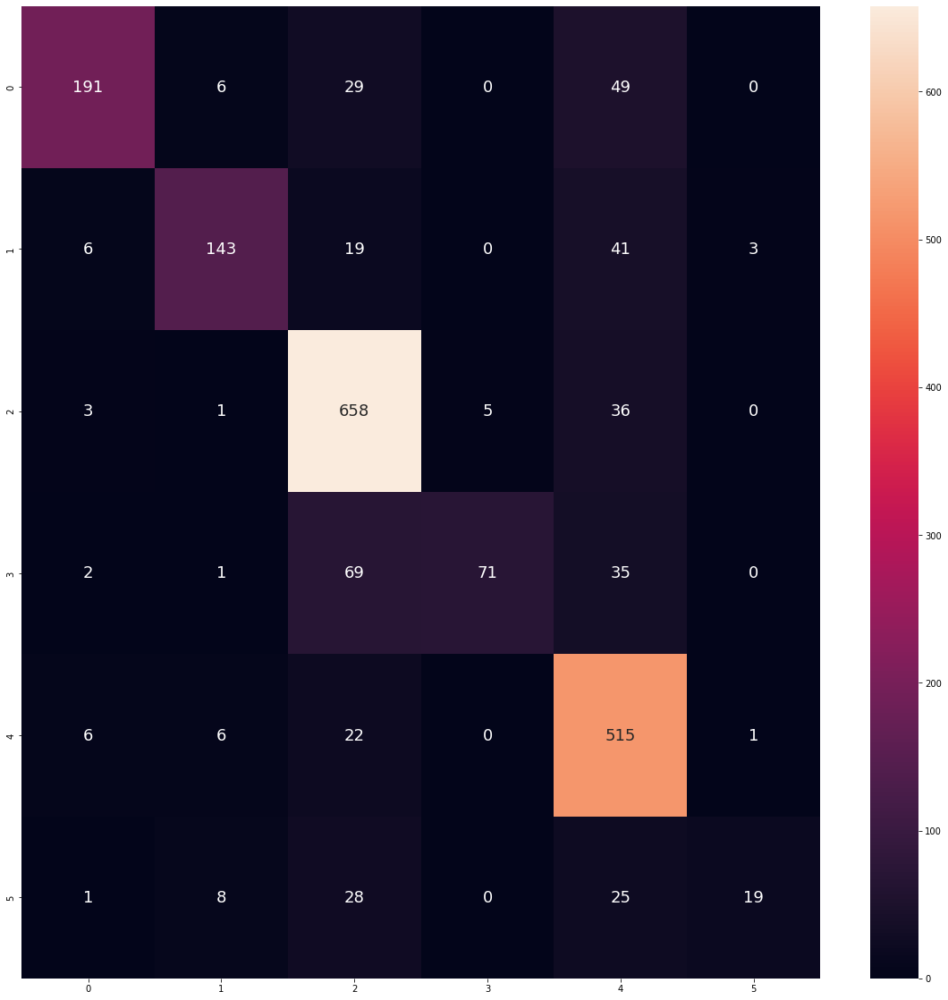

In [33]:
xLabel = val_data['clean_text']
yLabel = val_data['emotion']
(prediction, predScore) = Model_2.score(pipeline_2, xLabel, yLabel)

CM = Model_2.buildCM(prediction, yLabel)
Model_2.printCM(CM)
score_df = Model_2.printScore(predScore, CM)

avg = 0
for score in score_df['F1-score']:
    avg += score

avg /= 6

print("The average F1-score: %s" %round(avg, 2))


avg_val_data.append(avg)
score_df.head(n = 6)

### Linear Support Vector Machine (Model 3)

Lastly, we will be using a third model known as `Linear Support Vector Machine` to check if it is a more suitable model for our prediction.

In [34]:
from sklearn.svm import LinearSVC

Then, we will check the accuracy of our `Linear Support Vector Machine` model prediction on the train dataset.

The classification accuracy is:  0.992810702675669

The average F1-score: 0.99


,Emotion,Precision,Recall,F1-score
0,anger,0.991655,0.990736,0.991196
1,fear,0.988150,0.990191,0.989170
2,joy,0.993124,0.997015,0.995066
3,love,0.993018,0.981595,0.987273
4,sadness,0.994858,0.995497,0.995177
5,surprise,0.992870,0.973776,0.983230


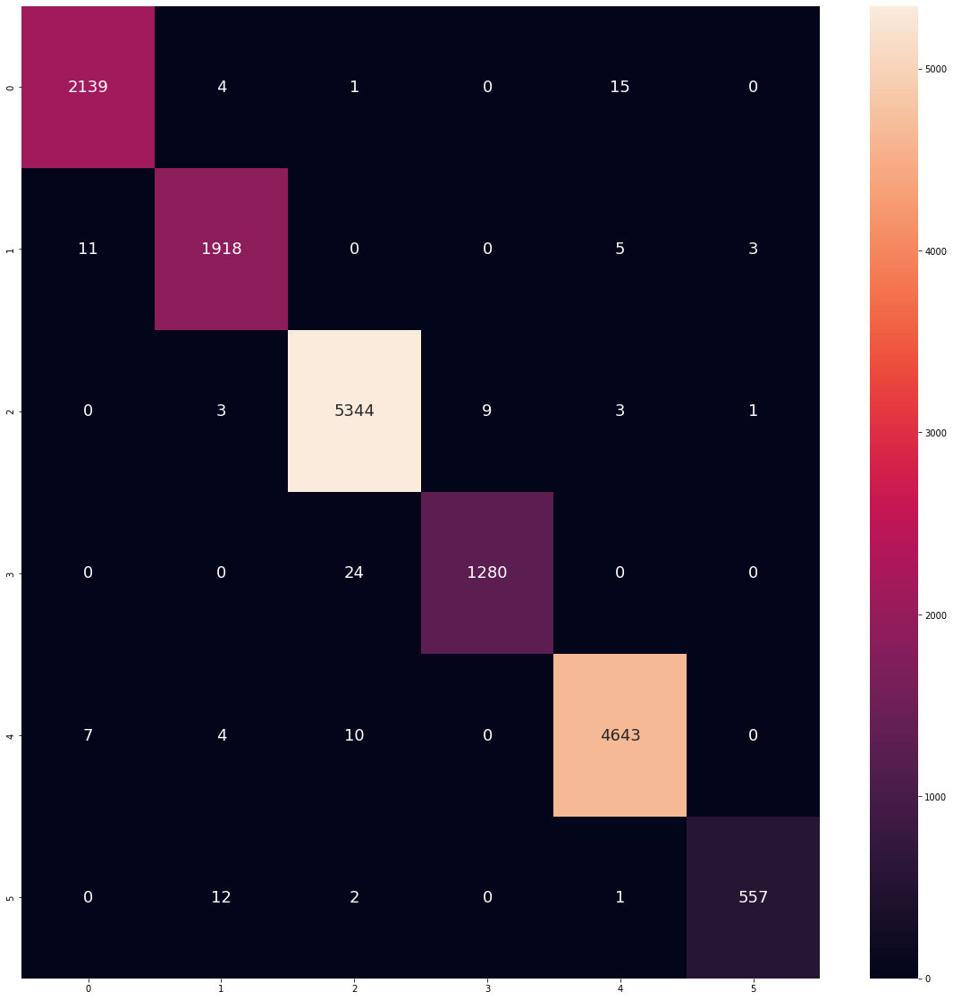

In [35]:
from sklearn.calibration import CalibratedClassifierCV
SVM = LinearSVC()
CLI = CalibratedClassifierCV(SVM)
Model_3 = NLPModel(train_data, CLI, 'svm', 'clean_text', 'emotion')
(x_train, y_train) = Model_3.getLabels()
pipeline_3 = Model_3.buildPipeline()
pipeline_3 = Model_3.fitModel(pipeline_3, x_train, y_train)
(prediction, predScore) = Model_3.score(pipeline_3, x_train, y_train)

CM = Model_3.buildCM(prediction, y_train)

Model_3.printCM(CM)
score_df = Model_3.printScore(predScore, CM)

avg = 0
for score in score_df['F1-score']:
    avg += score

avg /= 6

print("The average F1-score: %s" %round(avg, 2))


avg_train_data.append(avg)
score_df.head(n = 6)

Now, we will be testing our `Linear Support Vector Machine` model on the validation dataset to see how it performs.

The classification accuracy is:  0.9024512256128064

The average F1-score: 0.88


,Emotion,Precision,Recall,F1-score
0,anger,0.925651,0.905455,0.915441
1,fear,0.866337,0.825472,0.845411
2,joy,0.918425,0.928876,0.923621
3,love,0.845714,0.831461,0.838527
4,sadness,0.916071,0.932727,0.924324
5,surprise,0.804878,0.814815,0.809816


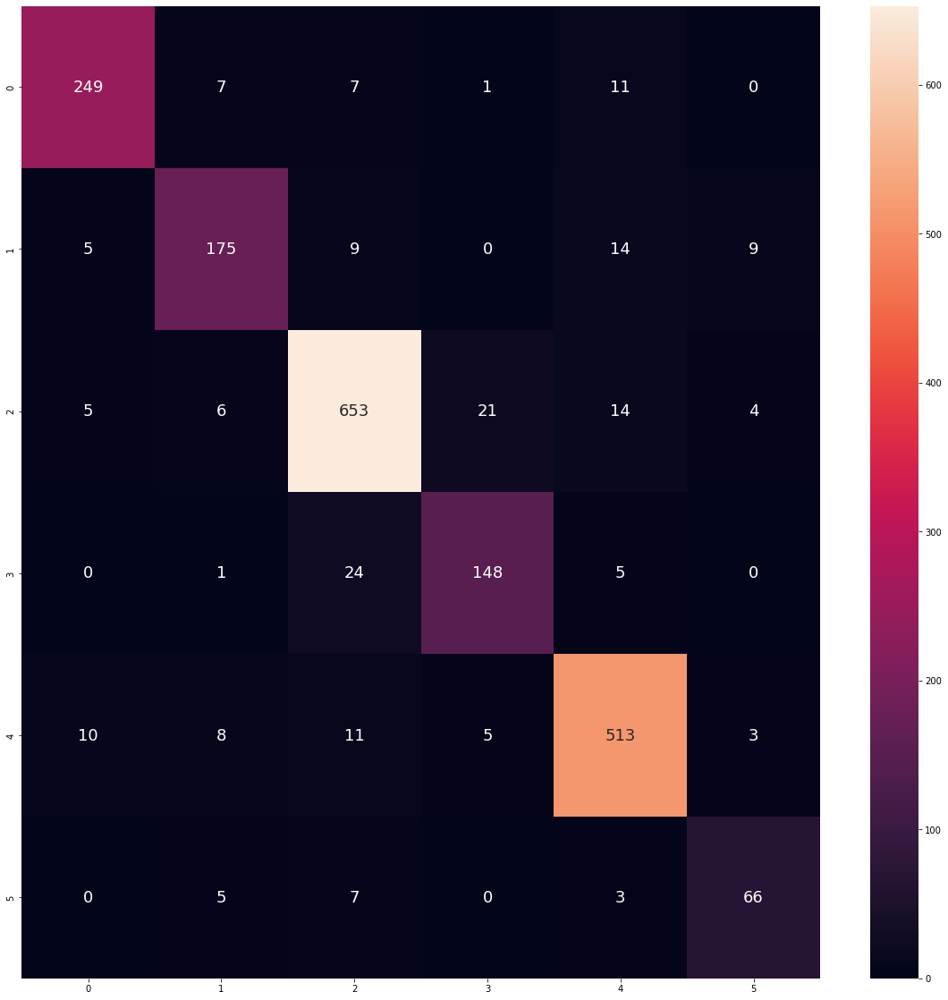

In [36]:
xLabel = val_data['clean_text']
yLabel = val_data['emotion']
(prediction, predScore) = Model_3.score(pipeline_3, xLabel, yLabel)

CM = Model_3.buildCM(prediction, yLabel)
Model_3.printCM(CM)
score_df = Model_3.printScore(predScore, CM)

avg = 0
for score in score_df['F1-score']:
    avg += score

avg /= 6

print("The average F1-score: %s" %round(avg, 2))


avg_val_data.append(avg)
score_df.head(n = 6)

The reason behind using F1-score as one of the measures to determine the ideal model is due to the class imbalance nature of our dataset.

In [37]:
f1_df = pd.DataFrame()

f1_df['model'] = ['Logistic Regression', 'Naive Bayes Algorithm', 'Linear Support Vector Machine']
f1_df['avg train F1-score'] = avg_train_data
f1_df['avg val F1-score'] = avg_val_data

f1_df.head()

,model,avg train F1-score,avg val F1-score
0,Logistic Regression,0.978335,0.868642
1,Naive Bayes Algorithm,0.858881,0.692819
2,Linear Support Vector Machine,0.990185,0.876190


We see that overall, `Linear Support Vector Machine` is a better model as seen by the **higher average F1-score** for train dataset and validation dataset.

On the contrary, it is interesting to see that `Naive Bayes Algorithm` has a much **lower average F1-score** compared to the other two models. This may be due to the fact that `Naive Bayes Algorithm` is much more bias, and assume independence of variables. Thus, when our validation dataset does not follow the same trend as the train dataset, the F1-score falls tremendously.

### Most Suitable Model (Cross-Validation Check)

Testing out our models only once is insufficient to conclude which model is the best model. Thus, we will be performing cross-validation to further verify the best model to use.

We will start by merging the train and validation dataset together.

In [38]:
#Merge Train and Val Data
data = pd.DataFrame().append([train_data, val_data])

data.describe()

,text,emotion,clean_text
count,17995,17995,17995
unique,17958,6,17713
top,i am not amazing or great at photography but i...,joy,stressed
freq,2,6063,6


In [39]:
from sklearn.model_selection import RepeatedKFold
from sklearn.model_selection import cross_val_score
from numpy import mean
from numpy import std

cv = RepeatedKFold(n_splits = 15, n_repeats = 5, random_state = 1)
total_scores = []

`Logistic Regression` Cross-Validation Check

In [40]:
Model_1 = NLPModel(data, LogisticRegression(), 'lr', 'clean_text', 'emotion')
(xLabel, yLabel) = Model_1.getLabels()

pipeline_1 = Model_1.buildPipeline()

# evaluate model
scores = cross_val_score(pipeline_1, xLabel, yLabel, scoring = 'accuracy', cv = cv, n_jobs = -1)

# report performance
print('Accuracy: %.3f (%.3f)' % (mean(scores), std(scores)))
total_scores.append((mean(scores), std(scores)))

Accuracy: 0.892 (0.009)


`Naive Bayes Algorithm` Cross-Validation Check

In [41]:
Model_2 = NLPModel(data, MultinomialNB(), 'nb', 'clean_text', 'emotion')
(xLabel, yLabel) = Model_2.getLabels()

pipeline_2 = Model_2.buildPipeline()

# evaluate model
scores = cross_val_score(pipeline_2, xLabel, yLabel, scoring = 'accuracy', cv = cv, n_jobs = -1)

# report performance
print('Accuracy: %.3f (%.3f)' % (mean(scores), std(scores)))
total_scores.append((mean(scores), std(scores)))

Accuracy: 0.799 (0.012)


`Linear Support Vector Machine` Cross-Validation Check

In [42]:
Model_3 = NLPModel(data, LinearSVC(), 'svm', 'clean_text', 'emotion')
(xLabel, yLabel) = Model_3.getLabels()

pipeline_3 = Model_3.buildPipeline()

# evaluate model
scores = cross_val_score(pipeline_3, xLabel, yLabel, scoring = 'accuracy', cv = cv, n_jobs = -1)

# report performance
print('Accuracy: %.3f (%.3f)' % (mean(scores), std(scores)))
total_scores.append((mean(scores), std(scores)))

Accuracy: 0.887 (0.009)


Let us view the summary of all the Cross-Validation scores for the 3 models we have tested.

In [43]:
total_scores_df = pd.DataFrame()
total_scores_df['model'] = ['Logistic Regression', 'Naive Bayes Algorithm', 'Linear Support Vector Machine']

mean_score = []
std_score = []
for (i, j) in total_scores:
    mean_score.append(round(i, 2))
    std_score.append(round(j, 4))

total_scores_df['mean'] = mean_score
total_scores_df['std dev'] = std_score

total_scores_df.head()

,model,mean,std dev
0,Logistic Regression,0.89,0.0091
1,Naive Bayes Algorithm,0.80,0.0119
2,Linear Support Vector Machine,0.89,0.0094


From the Cross-Validation Check we see that `Logistic Regression` and `Linear Support Vector Machine` have equivalent mean scores and roughly equivalent standard deviation.

To choose the most suitable model, we will further research on both `Logistic Regression` and `Linear Support Vector Machine`. Based on our research,  `Linear Support Vector Machine` is bettter suited for multi-class classification compared to `Logistic Regression`. `Logistic Regression` usually solves problem regarding probability. For example, a person is happy or not. For our problem, we are classifying the type of emotions rather than the probabilty of a emotion. Hence, `Linear Support Vector Machine` is the suitable  model for us.

### Testing the Model

We will testing `Linear Support Vector Machine` using our test data. Before that, we will be doing data cleaning to our test data

In [44]:
test_data = pd.read_csv("datasets/test.txt", sep = ';')


test_data = lemmatizeWords(test_data, 'text', 'clean_text')

html_removed = []

for sentence in test_data['clean_text']:
    # Remove any html tags and attribute that are in the sentence
    sentence = remove_html_attr(sentence, html_keys = html_keys)
    html_removed.append(sentence)

test_data['clean_text'] = html_removed

(outlier, test_data['clean_text']) = removeStopWords(test_data, 'clean_text')

# Remove the outliers from dataset
test_data = test_data.drop([test_data.index[loc] for loc in outlier])

The classification accuracy is:  0.8815

The average F1-score: 0.83


,Emotion,Precision,Recall,F1-score
0,anger,0.885185,0.869091,0.877064
1,fear,0.854545,0.839286,0.846847
2,joy,0.902579,0.906475,0.904523
3,love,0.763636,0.792453,0.777778
4,sadness,0.916382,0.924269,0.920308
5,surprise,0.704918,0.651515,0.677165


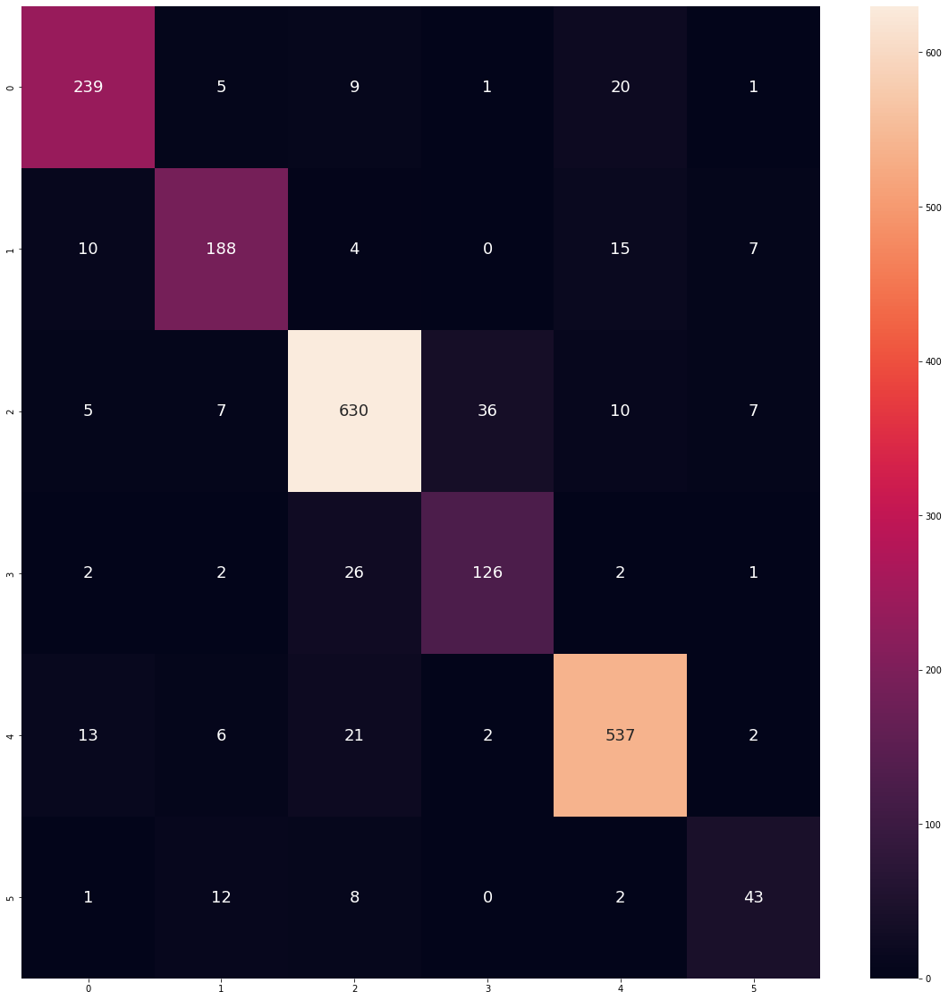

In [45]:
xLabel = test_data['clean_text']
yLabel = test_data['emotion']

# Using model 3 that was trained on train data
Model_3 = NLPModel(train_data, LinearSVC(), 'svm', 'clean_text', 'emotion')
(x_train, y_train) = Model_3.getLabels()
pipeline_3 = Model_3.buildPipeline()
pipeline_3 = Model_3.fitModel(pipeline_3, x_train, y_train)

# Using the model to predict test data
(prediction, predScore) = Model_3.score(pipeline_3, xLabel, yLabel)

CM = Model_3.buildCM(prediction, yLabel)
Model_3.printCM(CM)
score_df = Model_3.printScore(predScore, CM)

avg = 0
for score in score_df['F1-score']:
    avg += score

avg /= 6

print("The average F1-score: %s" %round(avg, 2))

score_df.head(n = 6)

### Save the model

Since we decide to use `Linear Support Vector Machine` as our final model in prediction, we save this model for the use of Application.

In [54]:
import joblib
from sklearn.calibration import CalibratedClassifierCV
SVM = LinearSVC()
CLI = CalibratedClassifierCV(SVM)
Model = NLPModel(train_data, CLI, 'svm', 'clean_text', 'emotion')
(x_train, y_train) = Model.getLabels()
pipeline = Model.buildPipeline()
pipeline = Model.fitModel(pipeline, x_train, y_train)
pipeline_file = open("emotion_classifier_pipe_lsv.pkl","wb")
joblib.dump(pipeline,pipeline_file)
pipeline_file.close()